# redo everything, but kill head 0,22

In [1]:
import torch
import math
from nnsight import CONFIG
from nnsight import LanguageModel
import nnsight
import numpy as np
import matplotlib.pyplot as plt
import os
from dotenv import load_dotenv
import random
from collections import defaultdict
import yaml 

load_dotenv()

c:\Users\durrc\OneDrive\Desktop\mech_interp_work\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


True

In [2]:
import pickle

# Save object to a file
def save_pickle(obj, filepath):
    with open(filepath, 'wb') as f:
        pickle.dump(obj, f)

# Load object from a file
def load_pickle(filepath):
    with open(filepath, 'rb') as f:
        return pickle.load(f)
    

import hashlib

def hash_string(input_string, algorithm='sha256'):
    """
    Hashes a string using the specified algorithm.

    Args:
        input_string: The string to be hashed.
        algorithm: The hashing algorithm to use (e.g., 'sha256', 'md5', 'sha1').
                   Defaults to 'sha256'.

    Returns:
        The hexadecimal representation of the hashed string.
    """

    try:
        # Encode the string to bytes
        encoded_string = input_string.encode('utf-8')

        # Create a hash object using the specified algorithm
        hash_object = hashlib.new(algorithm)

        # Update the hash object with the encoded string
        hash_object.update(encoded_string)

        # Return the hexadecimal representation of the hash
        return hash_object.hexdigest()

    except ValueError:
        return f"Invalid hashing algorithm: {algorithm}"

In [3]:
# importing from my own code 
from activation_transplanting import *
from analysis_tools import *

In [4]:
# read the api_key
CONFIG.set_default_api_key(os.environ.get('NDIF_KEY'))

# read the hf token
os.environ['HF_TOKEN'] = os.environ.get('HF_TOKEN')

In [5]:
NDIF_models = [
    "meta-llama/Meta-Llama-3.1-405B-Instruct",
    "meta-llama/Meta-Llama-3.1-8B",
    "meta-llama/Meta-Llama-3.1-70B",
    "deepseek-ai/DeepSeek-R1-Distill-Llama-70B",
    "deepseek-ai/DeepSeek-R1-Distill-Llama-8B"
] 

# inexaustive list
non_NDIF_models = [
    "meta-llama/Meta-Llama-3.1-8B",
]

In [6]:
# choose a model 
llama_model_string = "deepseek-ai/DeepSeek-R1-Distill-Llama-8B"
# remote = use NDIF
remote = True 

if remote and (llama_model_string not in NDIF_models):
    remote = False 
    print("Model not available on NDIF")

# load a model
llama = LanguageModel(llama_model_string)

# commented out for now
tk = LLamaExamineToolkit(
    llama_model=llama, 
    remote=True, 
)

Let's try to generate short-ish prompts which requires a few steps of reasoning. 

In [7]:
def map_prompt_to_file_string(string):
    assert "<｜User｜>" in string
    simplified_string = string.replace("<｜User｜>", "").replace("<｜Assistant｜>", "").replace("\\", "").lower()
    
    def is_allowed(char):
        return (ord('a')<=ord(char)<=ord('z')) or (ord('0')<=ord(char)<=ord('9'))
    
    hashed = hash_string(string)

    return ''.join([c if is_allowed(c) else '_' for c in simplified_string]).replace("__", "")+str(hashed)

In [42]:
# mostly for debugging

USE_CACHE = False

Note: below we modify the cache to be one specialized to our ablations

In [43]:
if USE_CACHE:
    with open('ablation_0_22_prompt_activity_cache.yaml', 'r') as file:
        prompt_cache = yaml.safe_load(file)
    if prompt_cache is None:
        prompt_cache={}

In [54]:
def generate_and_return_activity(
    llama,
    source_string: str,
    num_new_tokens: int,
    remote=True,
    ablate_head=(0, 22) # layer, head
):
    """
    given a source string, generate at most num_new_tokens
    and return their activation_containers

    We'll also zerop-ablate the 0,22 head

    Returns:
        The activation container containing the target activations 
    """

    if USE_CACHE and map_prompt_to_file_string(source_string) in prompt_cache:
        ac = load_pickle(prompt_cache[map_prompt_to_file_string(source_string)])
        #ac = loaded_cache[map_prompt_to_file_string(source_string)]
        return ac
    
    layers = llama.model.layers
    activation_container = ActivationContainer()

    """
    Below, we gather requisite information for ablating the 
    target attention head 
    This is done by zeroing out the particular inputs of the 
    output head 
    """
    ablate_layer_idx, ablate_head_idx = ablate_head
    head_dim = llama.config.head_dim 

    start_o = ablate_head_idx * head_dim
    end_o = (ablate_head_idx + 1) * head_dim

    layer_output = []
    
    with llama.generate(
        source_string,
        max_new_tokens=num_new_tokens,
        remote=remote,
    ) as tracer:
        encoded_source_string = llama.tokenizer.encode(source_string)
        # Intervene on the first generation step only
        for idx in range(num_new_tokens):
            for layer_idx, layer in enumerate(layers):
                if layer_idx==ablate_layer_idx:
                    # set the interval of the output to 0
                    # Extract configuration parameters. 
                    llama.model.layers[layer_idx].self_attn.o_proj.input[:, :, start_o:end_o]=0.0


                if idx == 0:
                    # extract all activations for the <bos>+prompt
                    for cur_tok_idx, token_int in enumerate(encoded_source_string):
                        #if layer_idx==5:
                        #    print("z", cur_tok_idx)
                        activation_container.set_activation(
                            token_index=cur_tok_idx,
                            layer_index=layer_idx,
                            tensor=layer.input[:, cur_tok_idx, :].save(),
                            label="residual_input",
                        )
                        if layer_idx == llama.config.num_hidden_layers - 1:
                            activation_container.set_activation(
                                token_index=cur_tok_idx,
                                layer_index=layer_idx,
                                tensor=llama.model.norm.output[
                                    :, cur_tok_idx, :
                                ].save(),
                                label="final_residual_output",
                            )
                else:
                    #if layer_idx==5:
                    #    print("o", idx+len(encoded_source_string)-1)
                    activation_container.set_activation(
                        token_index=idx+len(encoded_source_string)-1,
                        layer_index=layer_idx,
                        tensor=layer.input[:, -1, :].save(),
                        label="residual_input",
                    )
                    if layer_idx == llama.config.num_hidden_layers - 1:
                        activation_container.set_activation(
                            token_index=idx+len(encoded_source_string)-1,
                            layer_index=layer_idx,
                            tensor=llama.model.norm.output[
                                :, -1, :
                            ].save(),
                            label="final_residual_output",
                        )
                if layer_idx==0:
                    layer_output.append(llama.model.layers[layer_idx].self_attn.o_proj.output.save())
            # Proceed to the next token generation step
            
            layers.next()

        # Save and retrieve the generator output tokens
        out = llama.generator.output.save()
    
    # now deal with the remaining token ints
    for token_idx, token_int in enumerate(out[0][:-1]):
        activation_container.set_tokens(
            token_index=token_idx,
            token_int=token_int,
            token_string=llama.tokenizer.decode(token_int),
        )
    
    activation_container.set_values()
    
    if USE_CACHE:
        # save the activity_cash under a special string name 
        cache_key = map_prompt_to_file_string(source_string)
        # optional ending for time-uniqueness
        # +str(np.random.randint(1000000))
        pickle_file = os.path.join("ablation_0_22_activity_container_pickles", cache_key+".pkl")
        save_pickle(activation_container, pickle_file)
        prompt_cache[cache_key] = pickle_file
        with open('ablation_0_22_prompt_activity_cache.yaml', 'w') as file:
            yaml.safe_dump(prompt_cache, file)
    
    return activation_container, layer_output

In [85]:
activation_container, layer_output = generate_and_return_activity(
    llama,
    source_string:="<｜User｜> hey whats up",
    num_new_tokens=1,
    remote=True,
    ablate_head=(0, 22) # layer, head
)

activation_container_, layer_output_ = generate_and_return_activity(
    llama,
    source_string:="<｜User｜> hey whats up",
    num_new_tokens=1,
    remote=True,
    ablate_head=(0, 22) # layer, head
)

2025-04-13 14:40:07,895 0851cfea-0e7d-44ea-a10d-50381861b33e - RECEIVED: Your job has been received and is waiting approval.
2025-04-13 14:40:08,379 0851cfea-0e7d-44ea-a10d-50381861b33e - APPROVED: Your job was approved and is waiting to be run.
2025-04-13 14:40:08,935 0851cfea-0e7d-44ea-a10d-50381861b33e - RUNNING: Your job has started running.
2025-04-13 14:40:09,584 0851cfea-0e7d-44ea-a10d-50381861b33e - COMPLETED: Your job has been completed.
2025-04-13 14:40:12,004 671d0fc3-f4f6-4f9f-b7f3-6907d999be40 - RECEIVED: Your job has been received and is waiting approval.
2025-04-13 14:40:12,839 671d0fc3-f4f6-4f9f-b7f3-6907d999be40 - APPROVED: Your job was approved and is waiting to be run.
2025-04-13 14:40:13,491 671d0fc3-f4f6-4f9f-b7f3-6907d999be40 - RUNNING: Your job has started running.
2025-04-13 14:40:14,281 671d0fc3-f4f6-4f9f-b7f3-6907d999be40 - COMPLETED: Your job has been completed.


In [86]:
layer_output

[tensor([[[ 1.5182e-03, -4.2419e-03, -5.3406e-05,  ...,  1.8082e-03,
           -8.5449e-04, -9.1553e-04],
          [ 2.7161e-03, -5.5542e-03, -3.7766e-04,  ..., -1.6499e-04,
           -2.5330e-03,  7.6294e-06],
          [ 1.9073e-03, -1.0452e-03, -5.6152e-03,  ..., -7.1716e-04,
           -1.2970e-03, -3.2349e-03],
          [ 2.7924e-03,  3.1433e-03, -8.1787e-03,  ...,  2.8229e-03,
           -7.3624e-04, -5.2185e-03],
          [ 2.6703e-05,  5.7983e-03, -9.4604e-04,  ...,  6.6223e-03,
           -2.2697e-04, -1.1749e-03]]], dtype=torch.bfloat16)]

In [87]:
layer_output_

[tensor([[[ 1.5182e-03, -4.2419e-03, -5.3406e-05,  ...,  1.8082e-03,
           -8.5449e-04, -9.1553e-04],
          [ 2.7161e-03, -5.5542e-03, -3.7766e-04,  ..., -1.6499e-04,
           -2.5330e-03,  7.6294e-06],
          [ 1.9073e-03, -1.0452e-03, -5.6152e-03,  ..., -7.1716e-04,
           -1.2970e-03, -3.2349e-03],
          [ 2.7924e-03,  3.1433e-03, -8.1787e-03,  ...,  2.8229e-03,
           -7.3624e-04, -5.2185e-03],
          [ 2.6703e-05,  5.7983e-03, -9.4604e-04,  ...,  6.6223e-03,
           -2.2697e-04, -1.1749e-03]]], dtype=torch.bfloat16)]

In [88]:
layer_output

[tensor([[[ 1.5182e-03, -4.2419e-03, -5.3406e-05,  ...,  1.8082e-03,
           -8.5449e-04, -9.1553e-04],
          [ 2.7161e-03, -5.5542e-03, -3.7766e-04,  ..., -1.6499e-04,
           -2.5330e-03,  7.6294e-06],
          [ 1.9073e-03, -1.0452e-03, -5.6152e-03,  ..., -7.1716e-04,
           -1.2970e-03, -3.2349e-03],
          [ 2.7924e-03,  3.1433e-03, -8.1787e-03,  ...,  2.8229e-03,
           -7.3624e-04, -5.2185e-03],
          [ 2.6703e-05,  5.7983e-03, -9.4604e-04,  ...,  6.6223e-03,
           -2.2697e-04, -1.1749e-03]]], dtype=torch.bfloat16)]

In [89]:
layer_output[0]-layer_output_[0]

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], dtype=torch.bfloat16)

In [90]:
layer_output_

[tensor([[[ 1.5182e-03, -4.2419e-03, -5.3406e-05,  ...,  1.8082e-03,
           -8.5449e-04, -9.1553e-04],
          [ 2.7161e-03, -5.5542e-03, -3.7766e-04,  ..., -1.6499e-04,
           -2.5330e-03,  7.6294e-06],
          [ 1.9073e-03, -1.0452e-03, -5.6152e-03,  ..., -7.1716e-04,
           -1.2970e-03, -3.2349e-03],
          [ 2.7924e-03,  3.1433e-03, -8.1787e-03,  ...,  2.8229e-03,
           -7.3624e-04, -5.2185e-03],
          [ 2.6703e-05,  5.7983e-03, -9.4604e-04,  ...,  6.6223e-03,
           -2.2697e-04, -1.1749e-03]]], dtype=torch.bfloat16)]

In [91]:
activation_container_.set_values()
activation_container.set_values()

In [92]:
activation_container.get_activations_at_token_idx(0, "residual_input")

[tensor([[ 7.8201e-05,  1.1635e-04, -2.3651e-04,  ...,  9.9182e-04,
          -1.9670e-06, -1.2302e-04]], dtype=torch.bfloat16),
 tensor([[ 0.0016,  0.0031, -0.0006,  ...,  0.0142, -0.0031, -0.0064]],
        dtype=torch.bfloat16),
 tensor([[-0.0211,  0.1187, -0.0327,  ...,  0.6484,  0.1455, -0.0024]],
        dtype=torch.bfloat16),
 tensor([[-0.0261,  0.1260, -0.0294,  ...,  0.6562,  0.1602, -0.0092]],
        dtype=torch.bfloat16),
 tensor([[-0.0018,  0.1357, -0.0093,  ...,  0.6992,  0.1553, -0.0054]],
        dtype=torch.bfloat16),
 tensor([[-0.0225,  0.1377, -0.0019,  ...,  0.6680,  0.1914,  0.0049]],
        dtype=torch.bfloat16),
 tensor([[-0.0035,  0.1328,  0.0025,  ...,  0.6484,  0.2051,  0.0128]],
        dtype=torch.bfloat16),
 tensor([[0.0126, 0.1631, 0.0056,  ..., 0.5898, 0.2061, 0.0016]],
        dtype=torch.bfloat16),
 tensor([[ 0.0403,  0.2266, -0.0283,  ...,  0.5195,  0.1904,  0.0300]],
        dtype=torch.bfloat16),
 tensor([[ 0.0337,  0.2773, -0.0267,  ...,  0.4531,  

In [93]:
activation_container_.get_activations_at_token_idx(0, "residual_input")

[tensor([[ 7.8201e-05,  1.1635e-04, -2.3651e-04,  ...,  9.9182e-04,
          -1.9670e-06, -1.2302e-04]], dtype=torch.bfloat16),
 tensor([[ 0.0016,  0.0031, -0.0006,  ...,  0.0142, -0.0031, -0.0064]],
        dtype=torch.bfloat16),
 tensor([[-0.0211,  0.1187, -0.0327,  ...,  0.6484,  0.1455, -0.0024]],
        dtype=torch.bfloat16),
 tensor([[-0.0261,  0.1260, -0.0294,  ...,  0.6562,  0.1602, -0.0092]],
        dtype=torch.bfloat16),
 tensor([[-0.0018,  0.1357, -0.0093,  ...,  0.6992,  0.1553, -0.0054]],
        dtype=torch.bfloat16),
 tensor([[-0.0225,  0.1377, -0.0019,  ...,  0.6680,  0.1914,  0.0049]],
        dtype=torch.bfloat16),
 tensor([[-0.0035,  0.1328,  0.0025,  ...,  0.6484,  0.2051,  0.0128]],
        dtype=torch.bfloat16),
 tensor([[0.0126, 0.1631, 0.0056,  ..., 0.5898, 0.2061, 0.0016]],
        dtype=torch.bfloat16),
 tensor([[ 0.0403,  0.2266, -0.0283,  ...,  0.5195,  0.1904,  0.0300]],
        dtype=torch.bfloat16),
 tensor([[ 0.0337,  0.2773, -0.0267,  ...,  0.4531,  

In [94]:
diffs = []
for l1a, l2a in zip(activation_container.get_activations_at_token_idx(4, "residual_input"), activation_container_.get_activations_at_token_idx(4, "residual_input")):
    diffs.append(torch.sum((l1a-l2a)**2))

In [95]:
diffs

[tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=torch.bfloat16),
 tensor(0., dtype=to

Test this out

Now let's try to construct a dataset of computations, or things requiring some thoughts 



In [11]:
def collect_region_data(regions_list: list[list[tuple[int, tuple[str, int]]]], ac: ActivationContainer) -> dict[tuple[str, int], list[torch.Tensor]]:
    """ 
    create a dictionary mapping each (token_index, (token_str, token_int)) tuple to 
    a corresponding list of tensors
    each of shape (n, d)

    (each element in the list is its own layer's residuals)
    """
    total_region_dict = dict()
    for region_list in regions_list:
        for token_idx, (token_str, token_int) in region_list:
            if (token_str, token_int) not in total_region_dict:
                total_region_dict[(token_str, token_int)] = [[layer_res]
                    for layer_res in ac.get_activations_at_token_idx(token_idx, "residual_input")
                ]
            else:
                for layer_index, layer_res in enumerate(ac.get_activations_at_token_idx(token_idx, "residual_input")):
                    total_region_dict[(token_str, token_int)][layer_index].append(layer_res)
    
    # now combine these together 
    # note each layer has its own list of residuals 
    # once we combine, we end up with a list of Layers tensors of shape 
    # (num samples, res_dim)
    return {
        key: [torch.cat(tensor_list, dim=0) for tensor_list in list_of_tensor_list]
        for key, list_of_tensor_list in total_region_dict.items()
    }



In [12]:
def extract_reasoning_data(llama, string, think_pad=0, num_tokens=300):
    """ 
    given a string, format it, and generate output tokens 
    corresponding to the resulting reasoning 

    We'll split this into two sets of data:
        1) data corresponding to reasoning sections 
        text within <think>\n\n<\think> 
        for example:
            <think>\nExample thinking region\n<\think>

            the extracted token activation containers here
            would correspond to 
            "Example thinking region"
        
        2) data corresponding to text outside of reasoning sections

    think_pad: default = 0
        By default this is zero. This optionally allows us to pad the regions we extract
        Both inside and outside of thinking regions, we will skip think_pad tokens 

        this is to avoid the possibility of simply detecting the vectors corresponding 
        directly to the tokens <think>, \n, and <\think>
    
    return two dictionaries
    """
    ac = generate_and_return_activity(
        llama,
        source_string=f"<｜User｜>{string}<｜Assistant｜><think>\n",
        num_new_tokens=num_tokens,
        remote=True,
    )
    
    # Identify the first <think> token
    start_index = None
    for i in range(len(ac.token_idx_to_value_dict)):
        if ac.token_idx_to_value_dict[i][-1] == 128013:
            start_index = i + 1
            break
    assert start_index is not None, "No <think> token found in the input."+f"<｜User｜>{string}<｜Assistant｜><think>\n"
    
    # Collect tokens into regions based on whether we're "thinking" or not.
    # regions will be lists of elements of the form:
    # [(token_idx, (token_string, token_int)), ...]
    think_regions = []
    other_regions = []
    thinking = True
    cur_region = []
    for idx in range(start_index, len(ac.token_idx_to_value_dict)):
        token = ac.get_token_by_index(idx)
        
        if thinking and token[0] == '</think>':
            think_regions.append(cur_region)
            thinking = False 
            cur_region = []
        elif not thinking and token[0] == '<think>':
            other_regions.append(cur_region)
            thinking = True
            cur_region = []
        else:
            cur_region.append(
                (idx, token)
            )
    
    # Append any remaining tokens after loop ends.
    if cur_region:
        if thinking:
            think_regions.append(cur_region)
        else:
            other_regions.append(cur_region)
    
    # Adjust newline tokens within each region (modify the region list directly)
    assert llama.tokenizer.decode(271) == '\n\n'
    assert llama.tokenizer.decode(198) == '\n'
    
    for region in think_regions:
        # think regions may have start and stop /n tokens 
        if region and region[0][1][-1] == 198:
            region.pop(0)
        if region and region[-1][1][-1] == 198:
            region.pop()
    for region in other_regions:
        # other regions may start with /n/n
        if region and region[0][1][-1] == 271:
            region.pop(0)
    
    # Apply padding only if think_pad is nonzero.
    def apply_padding(regions, pad):
        if pad == 0:
            return regions
        # Only include regions that are long enough after padding.
        return [r[pad: -pad] for r in regions if len(r) > (1 + 2 * pad)]
    
    think_regions = apply_padding(think_regions, think_pad)
    other_regions = apply_padding(other_regions, think_pad)
    
    # Collect and return region data.
    think_dict = collect_region_data(think_regions, ac)
    other_dict = collect_region_data(other_regions, ac)

    return think_dict, other_dict


In [13]:
def combine_reasoning_data(dict_1, dict_2):
    """ 
    combine reasoning data dicts
    """
    all_keys = list(set(dict_1.keys()).union(dict_2.keys()))

    combined_dict = {}
    for k in all_keys:
        if k in dict_1 and k in dict_2:
            if len(dict_1[k]) != len(dict_2[k]):
                raise ValueError(f"Mismatch in list lengths for key {k}")
            combined_dict[k] = [torch.cat([t1, t2], dim=0) for t1, t2 in zip(dict_1[k], dict_2[k])]
        elif k in dict_1:
            combined_dict[k] = dict_1[k]
        else:
            combined_dict[k] = dict_2[k]
    
    return combined_dict


In [14]:
def read_prompts(file_path="reasoning-prompts.md"):
    """
    Read prompts from a text file and return them as a list of strings.
    
    Args:
        file_path (str): Path to the file containing reasoning prompts
        
    Returns:
        list: A list of strings, each containing a reasoning prompt
    """
    prompts = []
    
    try:
        with open(file_path, 'r', encoding='utf-8') as file:
            for line in file:
                # Skip empty lines, headers, and category labels
                line = line.strip()
                if (line and 
                    not line.startswith('#') and 
                    not line.startswith('##') and
                    not line == ""):
                    
                    # Extract the prompt text by removing the number and period
                    parts = line.split('. ', 1)
                    if len(parts) > 1 and parts[0].isdigit():
                        prompt = parts[1]
                    else:
                        prompt = line
                        
                    prompts.append(prompt)
    except FileNotFoundError:
        print(f"Error: File '{file_path}' not found.")
    except Exception as e:
        print(f"Error reading prompts: {e}")
    
    return prompts

# now let's collect reasoning data

In [15]:
def collect_reasoning_dataset(string_list: list[str]):
    output_think_dict = {}
    output_other_dict = {}

    for string in string_list:
        think_dict, other_dict = extract_reasoning_data(llama, string, think_pad=0, num_tokens=300)

        output_think_dict = combine_reasoning_data(output_think_dict, think_dict)
        output_other_dict = combine_reasoning_data(output_other_dict, other_dict)

    return output_think_dict, output_other_dict

In [16]:
# build up the prompt cache 

reasoning_string_list = read_prompts()

prompt_cache = {}

for string in reasoning_string_list:
    source_string=f"<｜User｜>{string}<｜Assistant｜><think>\n"

    cache_key = map_prompt_to_file_string(source_string)
    # optional ending for time-uniqueness
    # +str(np.random.randint(1000000))
    pickle_file = os.path.join("ablation_0_22_activity_container_pickles", cache_key+".pkl")
    if os.path.isfile(pickle_file):
        prompt_cache[cache_key] = pickle_file
    else:
        print("prompt not present: ", source_string)

with open('ablation_0_22_prompt_activity_cache.yaml', 'w') as file:
    yaml.safe_dump(prompt_cache, file)
    


prompt not present:  <｜User｜>What is the square root of 144?<｜Assistant｜><think>

prompt not present:  <｜User｜>If x + 5 = 12, what is the value of x?<｜Assistant｜><think>

prompt not present:  <｜User｜>What integer's square root is closest to 6.3?<｜Assistant｜><think>

prompt not present:  <｜User｜>What is (2 + 7) × 4?<｜Assistant｜><think>

prompt not present:  <｜User｜>If I have 24 marbles and give away 1/3 of them, how many do I have left?<｜Assistant｜><think>

prompt not present:  <｜User｜>What is 15% of 80?<｜Assistant｜><think>

prompt not present:  <｜User｜>If a rectangle has a length of 8 cm and a width of 5 cm, what is its perimeter?<｜Assistant｜><think>

prompt not present:  <｜User｜>What is the sum of the first 10 integers?<｜Assistant｜><think>

prompt not present:  <｜User｜>If 3x - 7 = 14, what is the value of x?<｜Assistant｜><think>

prompt not present:  <｜User｜>What is the average of 17, 23, and 30?<｜Assistant｜><think>

prompt not present:  <｜User｜>If a car travels at 60 miles per hour, h

In [17]:
read_prompts()

['What is the square root of 144?',
 'If x + 5 = 12, what is the value of x?',
 "What integer's square root is closest to 6.3?",
 'What is (2 + 7) × 4?',
 'If I have 24 marbles and give away 1/3 of them, how many do I have left?',
 'What is 15% of 80?',
 'If a rectangle has a length of 8 cm and a width of 5 cm, what is its perimeter?',
 'What is the sum of the first 10 integers?',
 'If 3x - 7 = 14, what is the value of x?',
 'What is the average of 17, 23, and 30?',
 'If a car travels at 60 miles per hour, how far will it travel in 2.5 hours?',
 'What is the area of a circle with radius 4 cm? (Use π = 3.14)',
 'If y = 3x + 2 and x = 4, what is y?',
 'What is the next number in the sequence: 2, 4, 8, 16, ...?',
 'If a triangle has sides of length 3, 4, and 5, what is its area?',
 'What is 7² - 3²?',
 'If 20% of a number is 35, what is the number?',
 'What is the product of 1.5 and 0.8?',
 'If a pizza is cut into 8 equal slices and 3 slices are eaten, what fraction remains?',
 'What is t

In [18]:
reasoning_string_list = read_prompts()[:50]

In [19]:
len(reasoning_string_list)

50

# let's build up the cache

we'll just run this on the first 50 for now 

In [21]:
for string in reasoning_string_list[:50]:
    ac = generate_and_return_activity(
        llama,
        source_string=f"<｜User｜>{string}<｜Assistant｜><think>\n",
        num_new_tokens=300,
        remote=True,
    )

2025-04-11 13:33:21,264 a514f086-f97a-4fa6-977a-346ce7e06499 - RECEIVED: Your job has been received and is waiting approval.
2025-04-11 13:33:21,996 a514f086-f97a-4fa6-977a-346ce7e06499 - APPROVED: Your job was approved and is waiting to be run.
2025-04-11 13:33:26,706 a514f086-f97a-4fa6-977a-346ce7e06499 - RUNNING: Your job has started running.
2025-04-11 13:33:58,446 a514f086-f97a-4fa6-977a-346ce7e06499 - COMPLETED: Your job has been completed.
2025-04-11 13:34:59,163 44b97543-12c9-4833-81fc-74be45b11939 - RECEIVED: Your job has been received and is waiting approval.
2025-04-11 13:34:59,680 44b97543-12c9-4833-81fc-74be45b11939 - APPROVED: Your job was approved and is waiting to be run.
2025-04-11 13:35:04,697 44b97543-12c9-4833-81fc-74be45b11939 - RUNNING: Your job has started running.
2025-04-11 13:35:26,413 44b97543-12c9-4833-81fc-74be45b11939 - COMPLETED: Your job has been completed.
2025-04-11 13:36:33,163 9701ada7-a6d6-4075-9232-af5a3a66353f - RECEIVED: Your job has been receive

In [34]:
generated_strings = []
for string in reasoning_string_list[:50]:
    ac = generate_and_return_activity(
        llama,
        source_string=f"<｜User｜>{string}<｜Assistant｜><think>\n",
        num_new_tokens=300,
        remote=True,
    )
    _, full_string = zip(*sorted([(i, v) for i, (v, x) in ac.token_idx_to_value_dict.items()]))
    generated_strings.append(''.join(full_string))

In [37]:
for generated_string in    generated_strings:
    print(generated_string)
    print("\n")

<｜begin▁of▁sentence｜><｜User｜>What is the square root of 144?<｜Assistant｜><think>
To determine the square root of 144, I start by understanding that a square root of a number finds another number that, when multiplied by itself, gives the original number.

First, I'll list the perfect squares of numbers to find which one equals 144. Starting from smaller numbers:

- 1 squared is 1.
- 2 squared is 4.
- 3 squared is 9.
- 4 squared is 16.
- 5 squared is 25.
- 6 squared is 36.
- 7 squared is 49.
- 8 squared is 64.
- 9 squared is 81.
- 10 squared is 100.
- 11 squared is 121.
- 12 squared is 144.

Since 12 multiplied by 12 equals 144, the square root of 144 is 12.
</think>

To find the square root of 144, we need to determine which number multiplied by itself equals 144.

1. **List of Perfect Squares:**
   
   - \(1^2 = 1\)
   - \(2^2 = 4\)
   - \(3^2 = 9\)
   - \(4^2 = 16\)
   - \(5^2 = 25\)
   - \(6^2 = 36\)
   - \(7^2 = 49\)
   - \(8^2 = 64\)
  


<｜begin▁of▁sentence｜><｜User｜>If x + 5 = 12

In [22]:
output_think_dict, output_other_dict = collect_reasoning_dataset(reasoning_string_list)

# what words are we comparing ?

In [23]:
words_counts = [(k, min(output_think_dict[k][0].shape[0], output_other_dict[k][0].shape[0])) for k in output_other_dict if k in output_think_dict]
words_counts.sort(key = lambda x: x[-1], reverse=True)

for w, c in words_counts:
    print(w, c)

(' ', 220) 363
(' the', 279) 222
('.', 13) 143
('2', 17) 97
('3', 18) 94
(' \\', 1144) 87
(' of', 315) 78
(',', 11) 61
(' \\(', 18240) 56
('4', 19) 55
(' =', 284) 50
(' is', 374) 41
('5', 20) 36
(' to', 311) 35
('8', 23) 33
(' by', 555) 31
(')', 8) 30
(':', 25) 30
(' find', 1505) 29
('6', 21) 29
('7', 22) 27
(' +', 489) 27
('To', 1271) 25
('.\n\n', 382) 25
('1', 16) 24
(' number', 1396) 24
(' a', 264) 23
(' and', 323) 19
(' in', 304) 18
(' x', 865) 17
('16', 845) 17
('12', 717) 16
('-', 12) 16
('{', 90) 15
('}', 92) 14
('}{', 15523) 13
('frac', 38118) 13
(' formula', 15150) 13
('0', 15) 13
(' for', 369) 12
('),', 705) 12
(' y', 379) 12
('x', 87) 12
(' -', 482) 11
(' equation', 24524) 11
(' The', 578) 11
('9', 24) 11
(' determine', 8417) 11
('.\n', 627) 10
(' can', 649) 10
('^', 61) 10
(' square', 9518) 10
(' cost', 2853) 10
(' value', 907) 10
(' (', 320) 10
(' numbers', 5219) 10
('100', 1041) 9
(' per', 824) 9
(' both', 2225) 9
('14', 975) 9
('times', 15487) 9
('10', 605) 9
('25', 914)

# Now analyze reasoning data

let's perform LDA for each layer

doing LDA


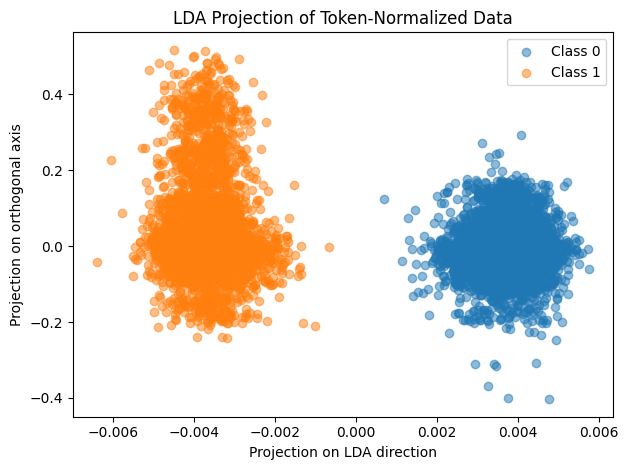

plotting 1d hists


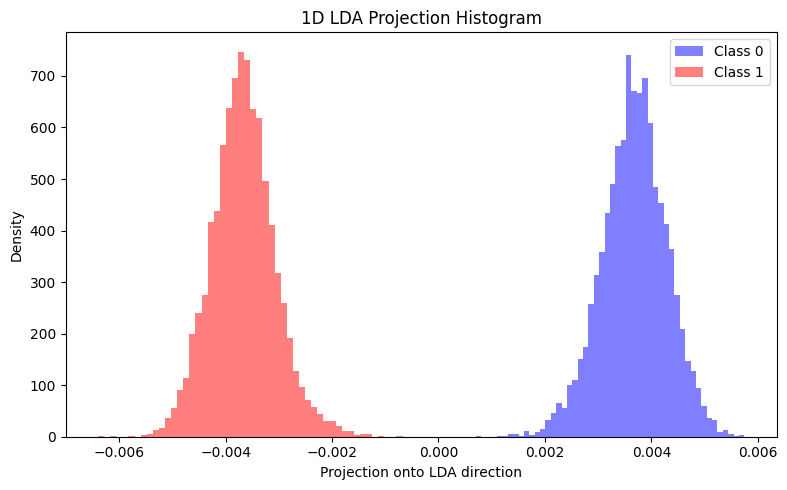

plotting 2d projection


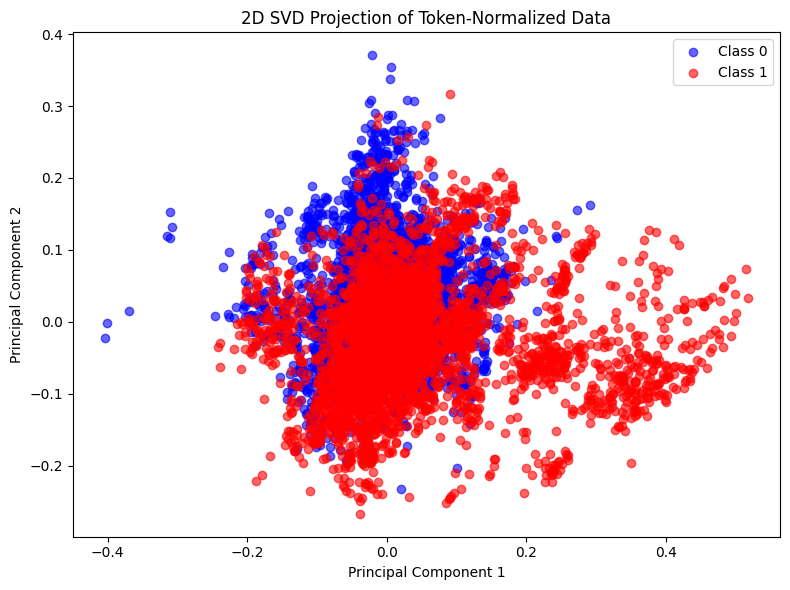

How well does each token difference align with LDA w
doing LDA


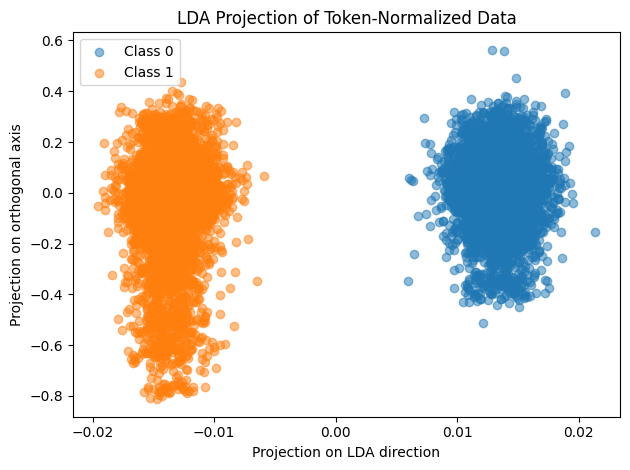

plotting 1d hists


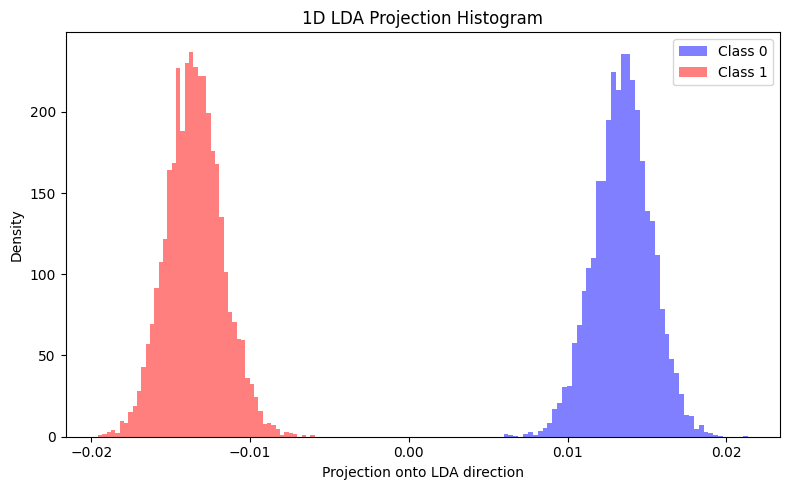

plotting 2d projection


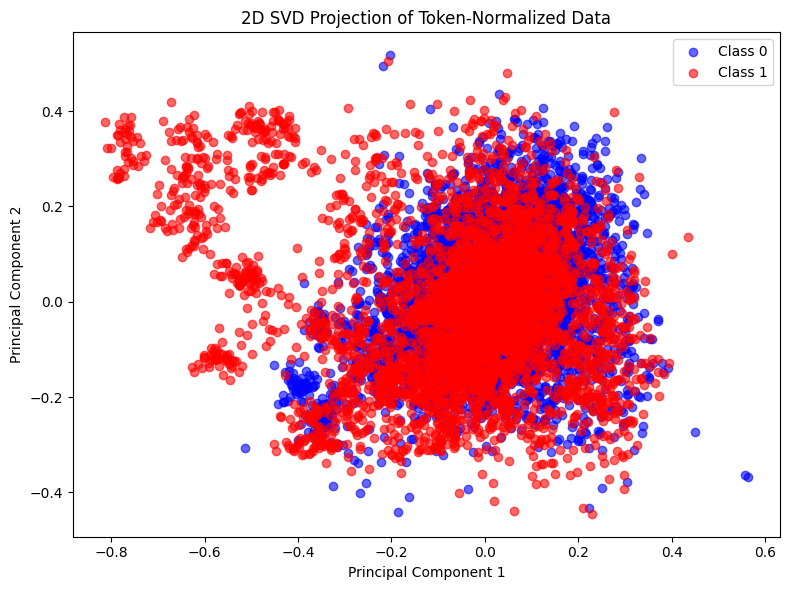

How well does each token difference align with LDA w
doing LDA


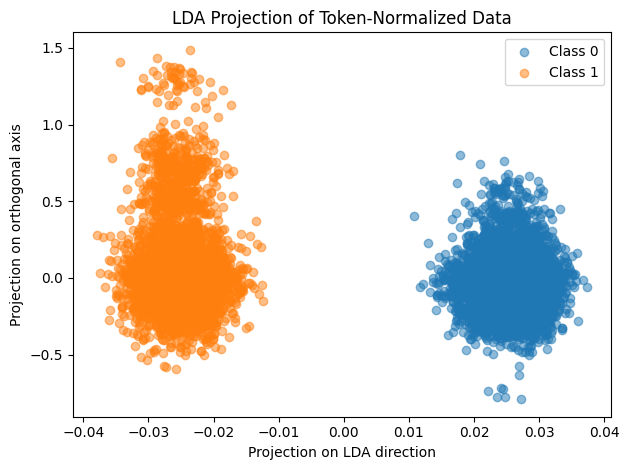

plotting 1d hists


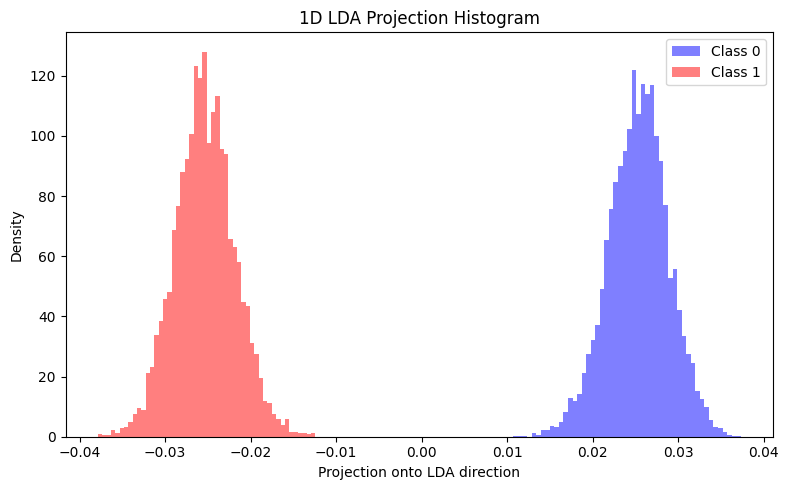

plotting 2d projection


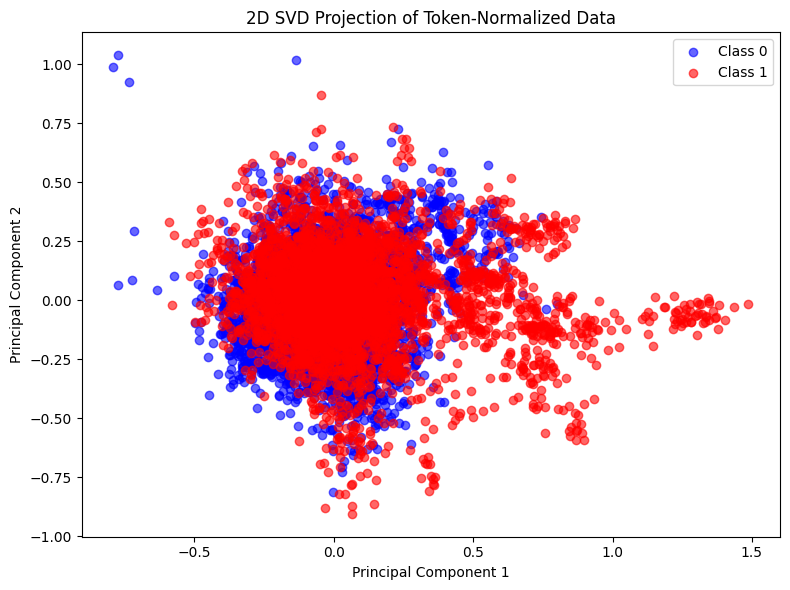

How well does each token difference align with LDA w
doing LDA


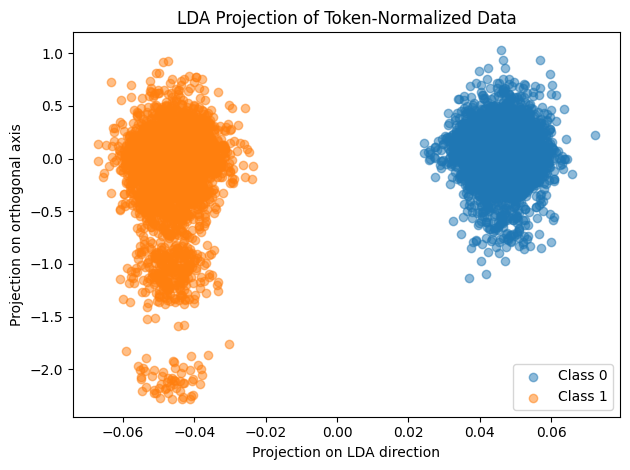

plotting 1d hists


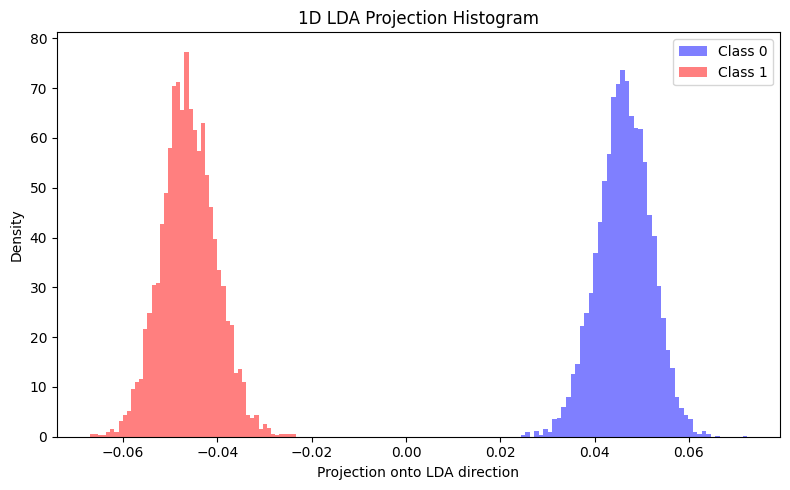

plotting 2d projection


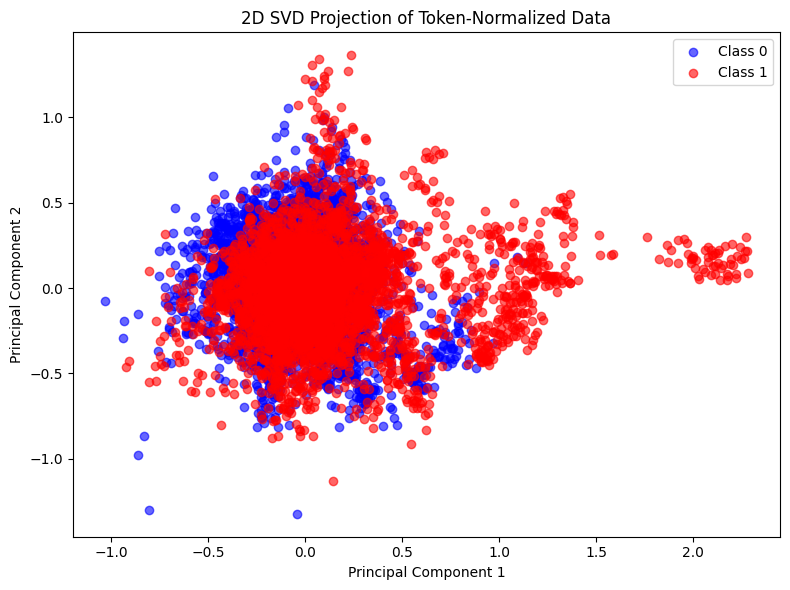

How well does each token difference align with LDA w
doing LDA


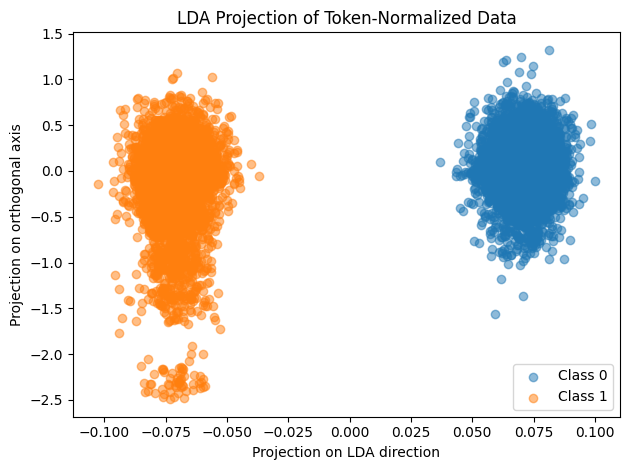

plotting 1d hists


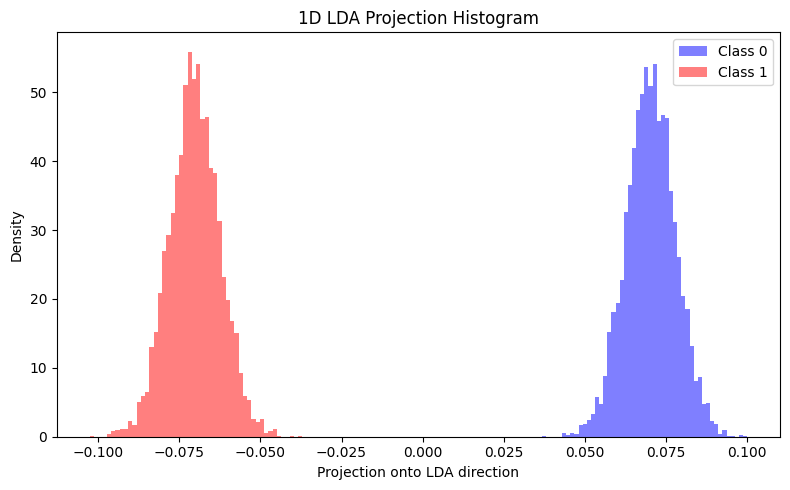

plotting 2d projection


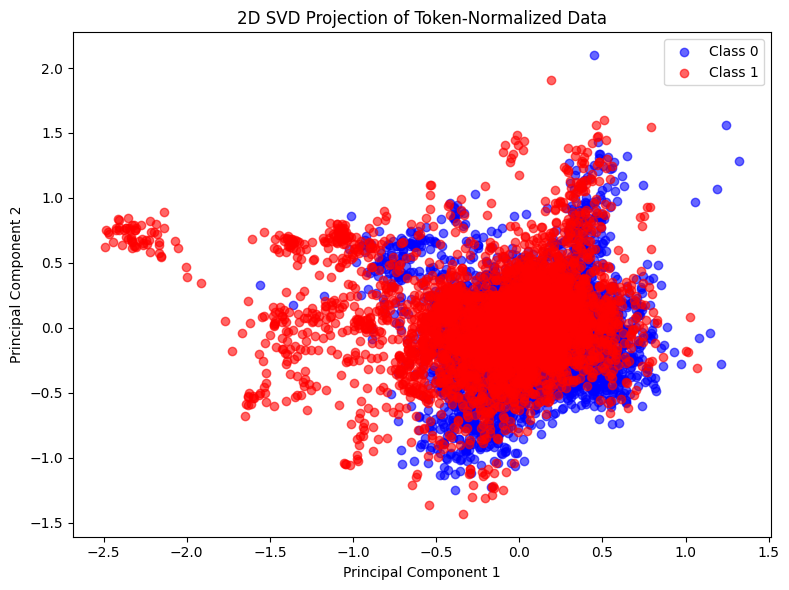

How well does each token difference align with LDA w
doing LDA


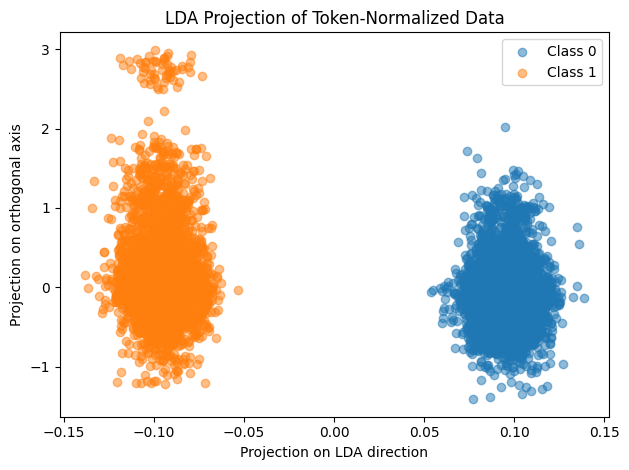

plotting 1d hists


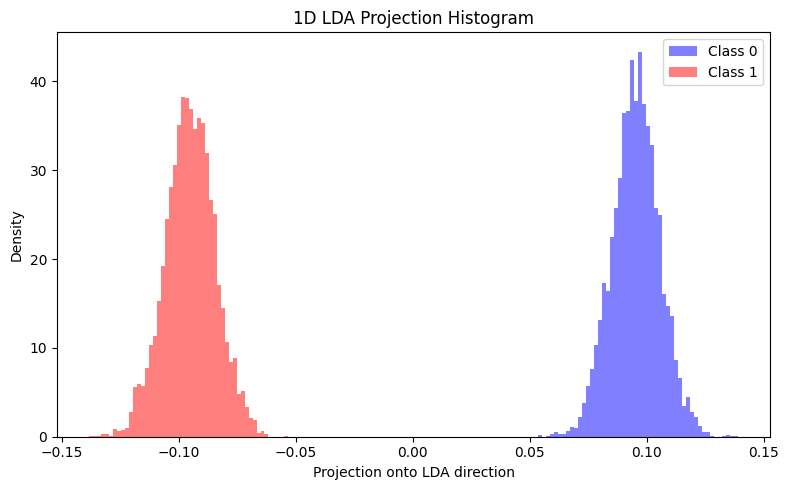

plotting 2d projection


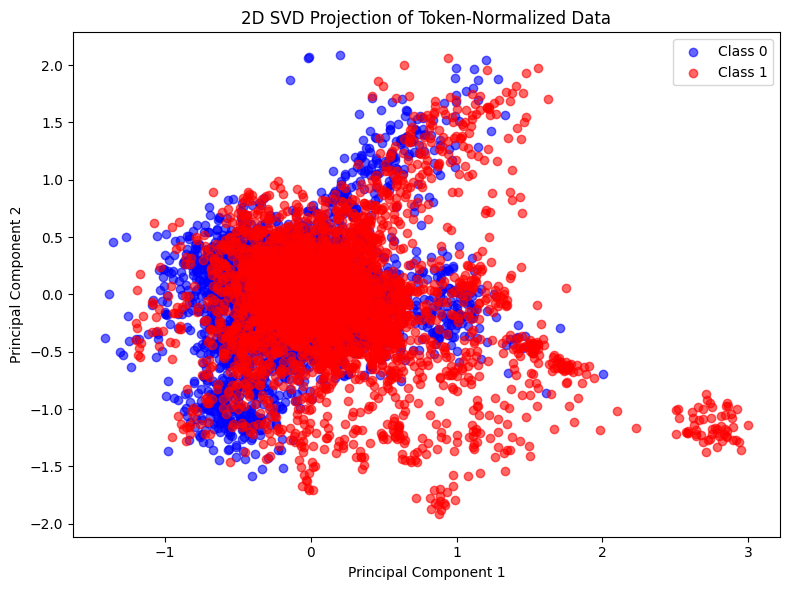

How well does each token difference align with LDA w
doing LDA


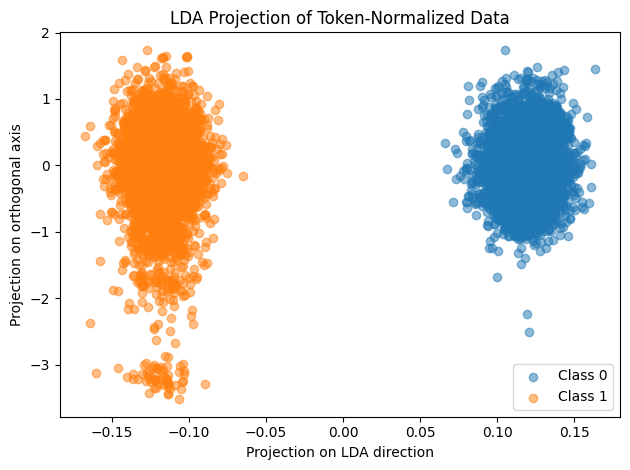

plotting 1d hists


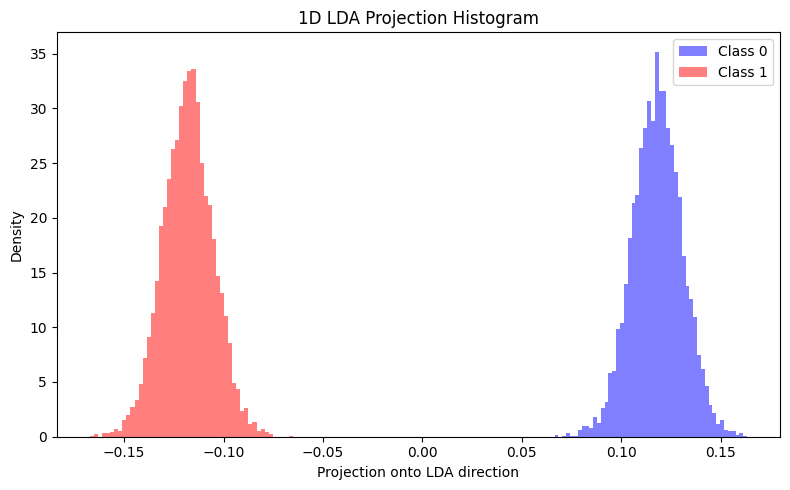

plotting 2d projection


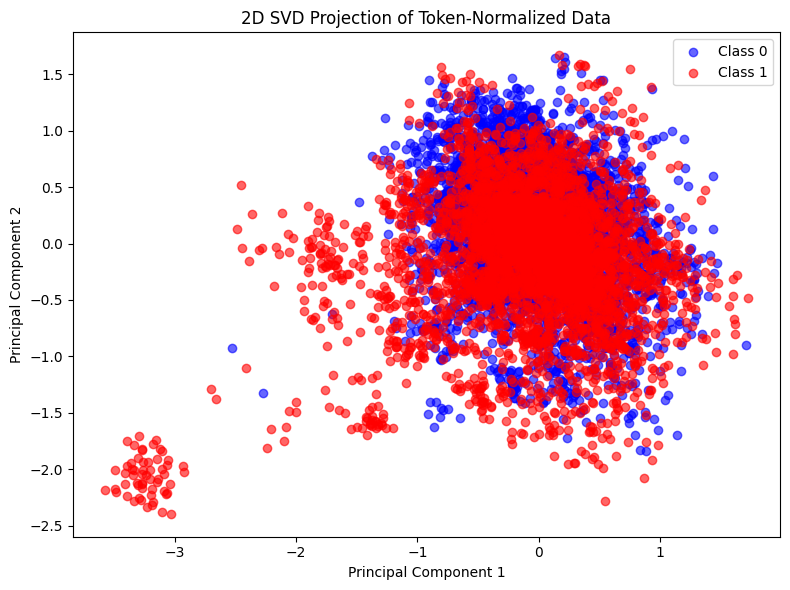

How well does each token difference align with LDA w
doing LDA


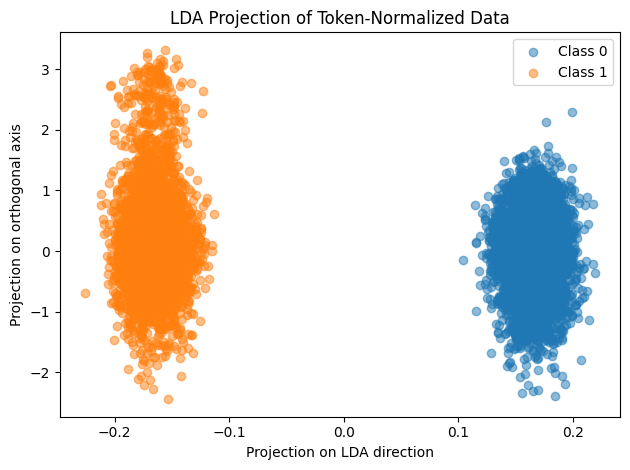

plotting 1d hists


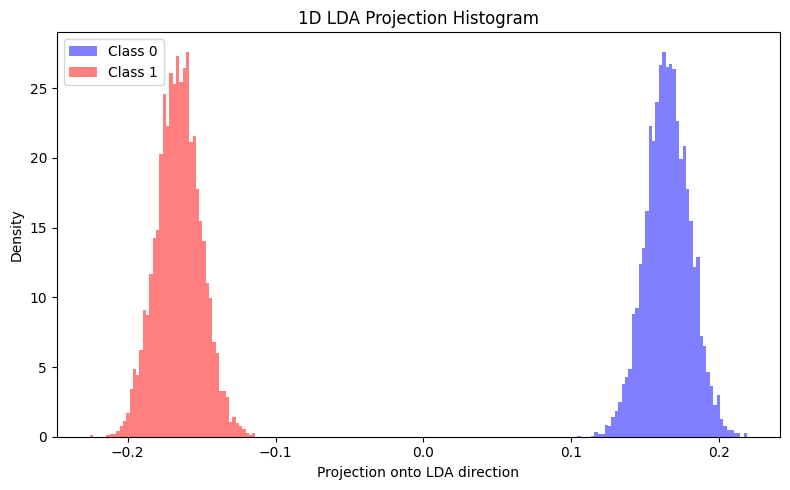

plotting 2d projection


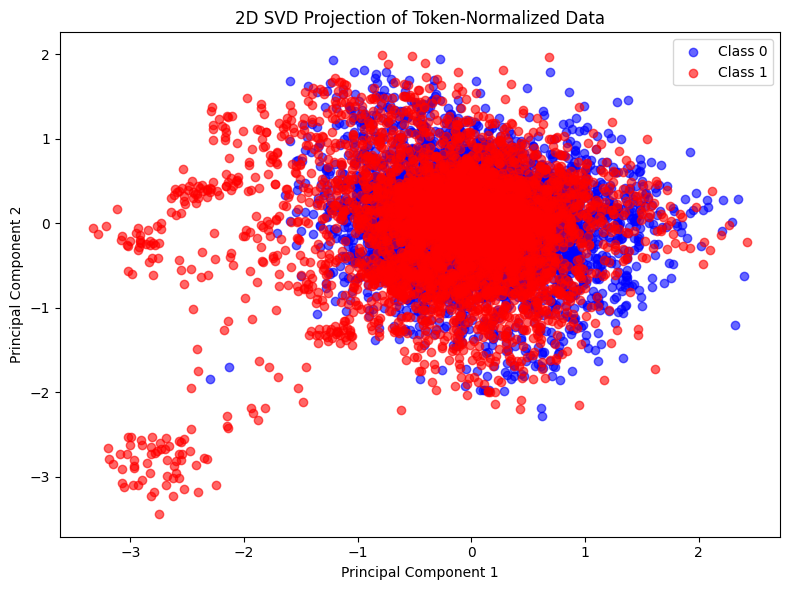

How well does each token difference align with LDA w
doing LDA


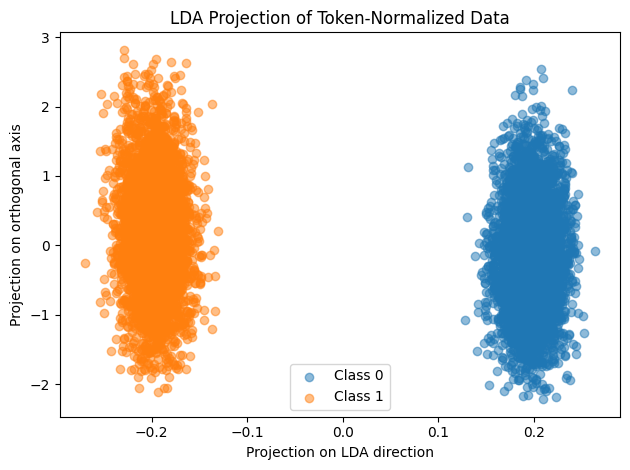

plotting 1d hists


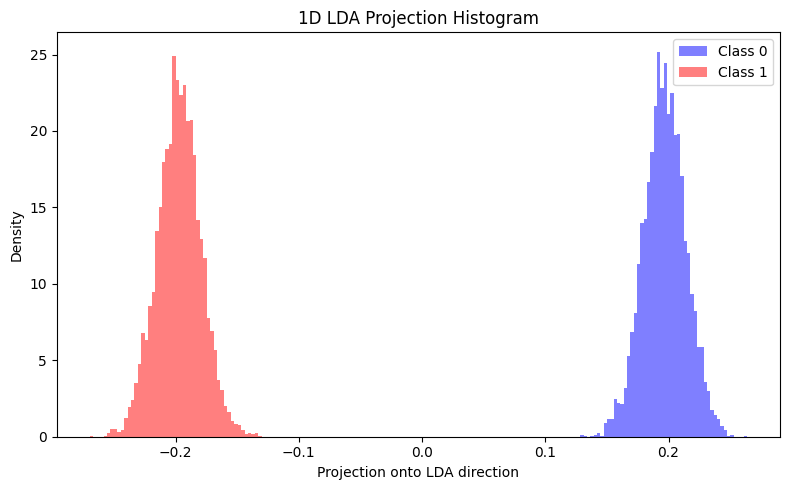

plotting 2d projection


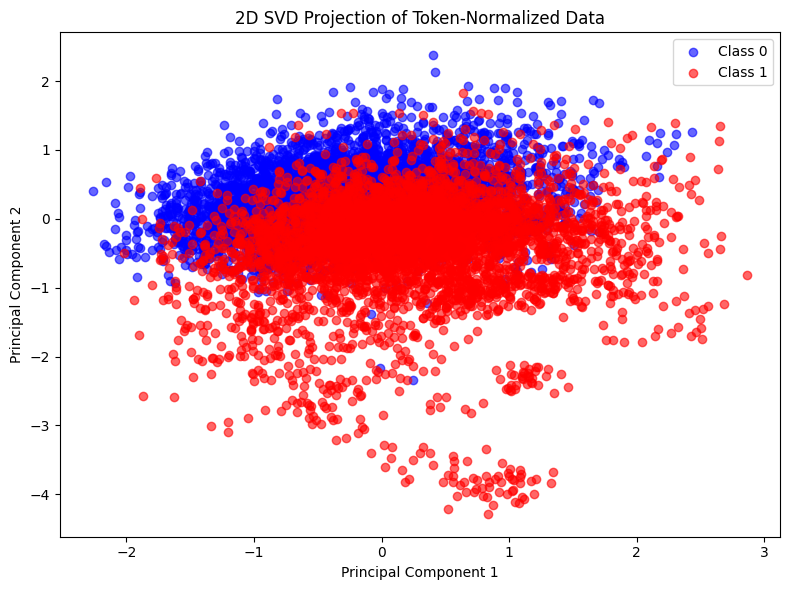

How well does each token difference align with LDA w
doing LDA


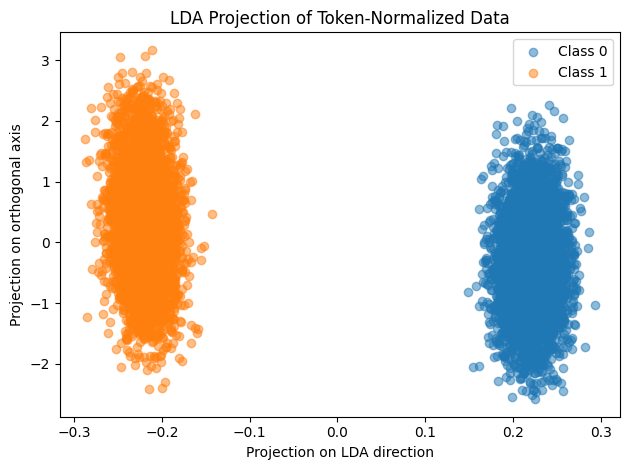

plotting 1d hists


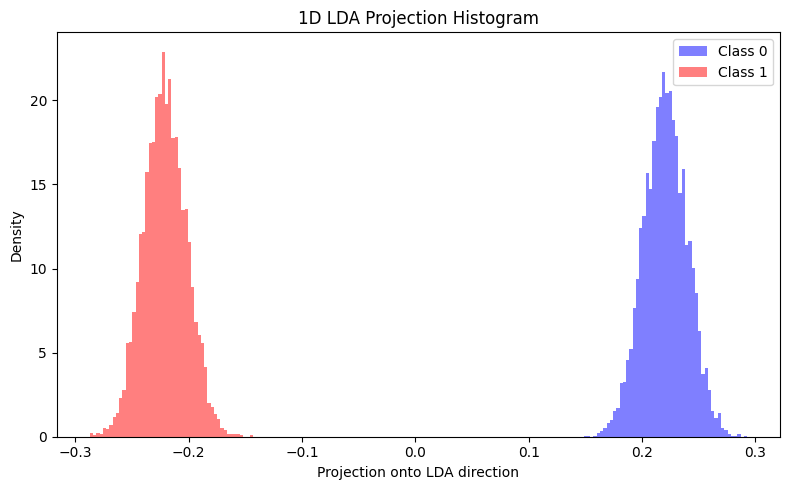

plotting 2d projection


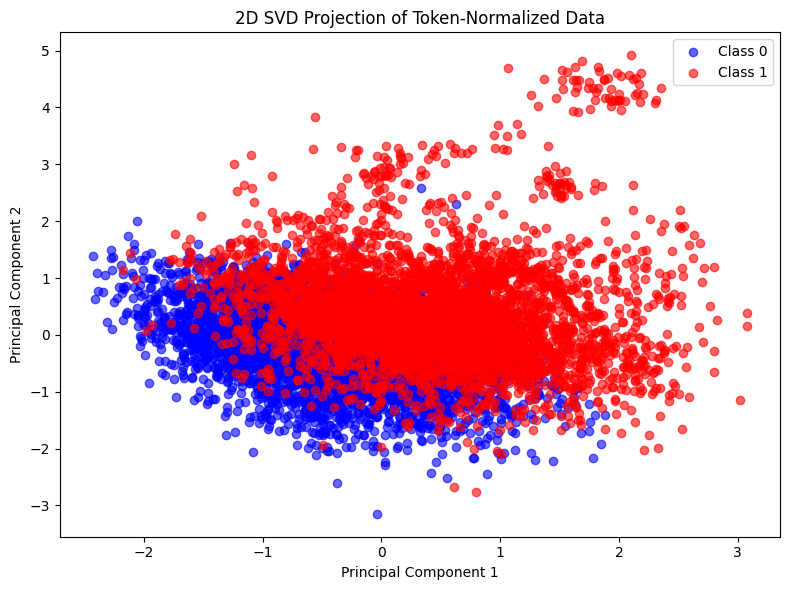

How well does each token difference align with LDA w
doing LDA


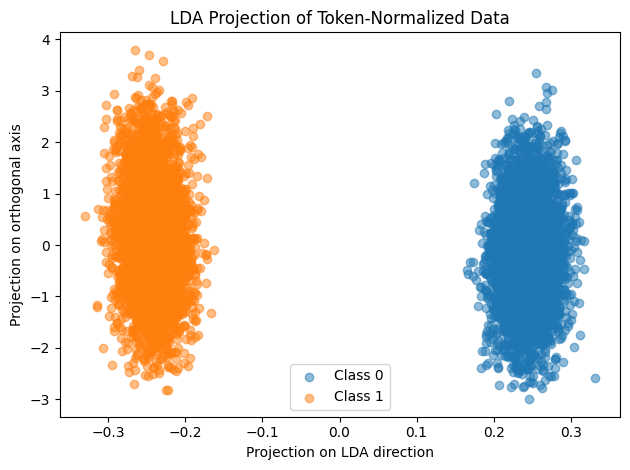

plotting 1d hists


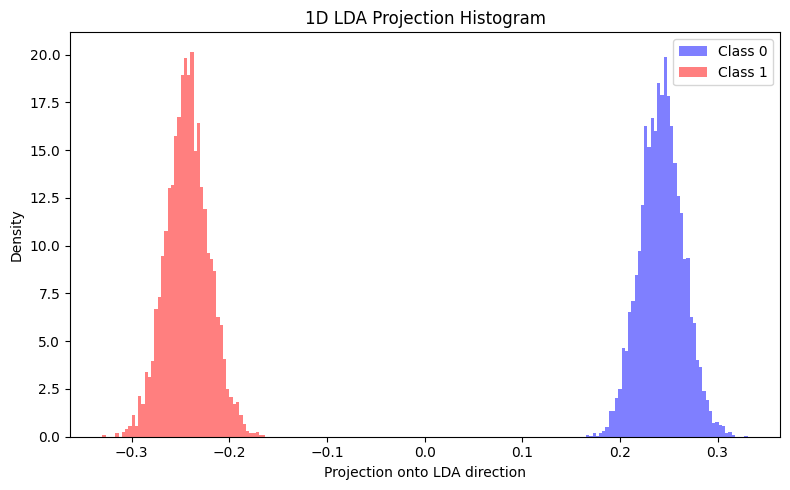

plotting 2d projection


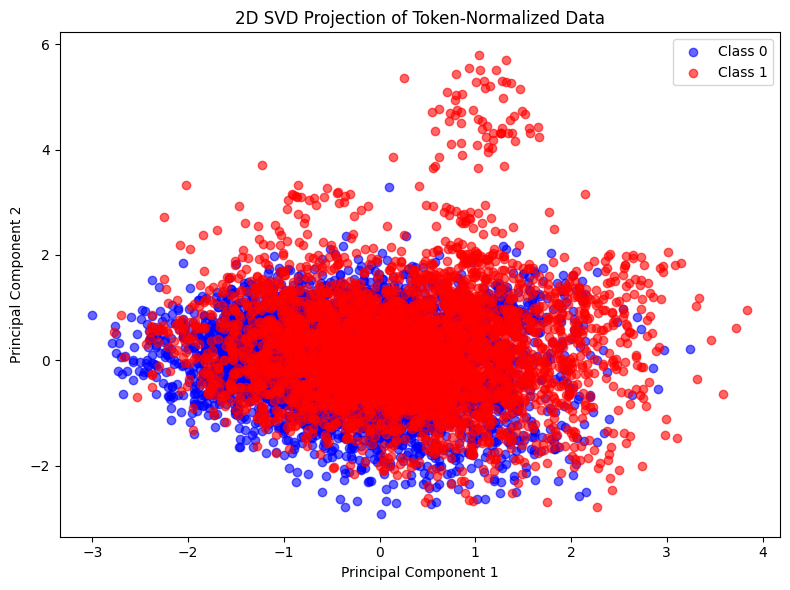

How well does each token difference align with LDA w
doing LDA


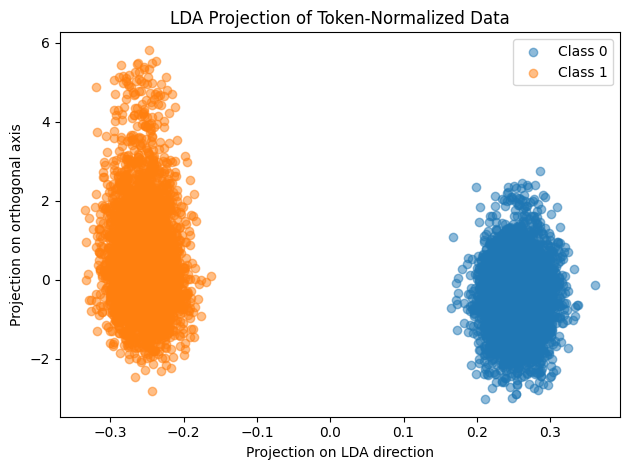

plotting 1d hists


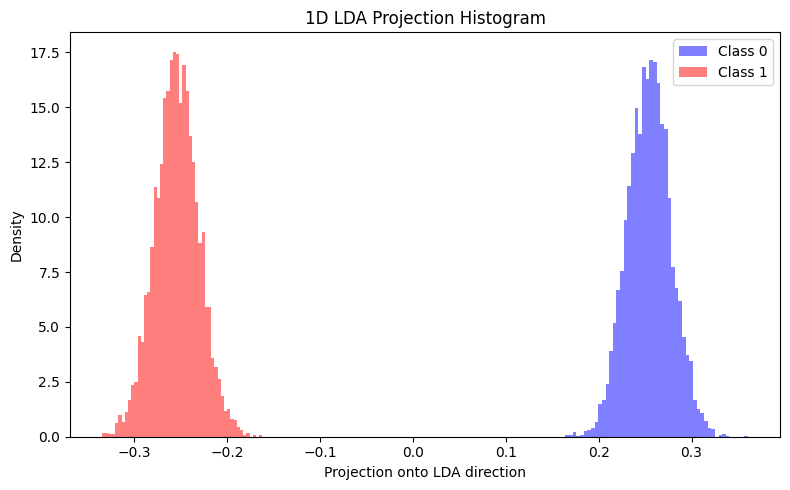

plotting 2d projection


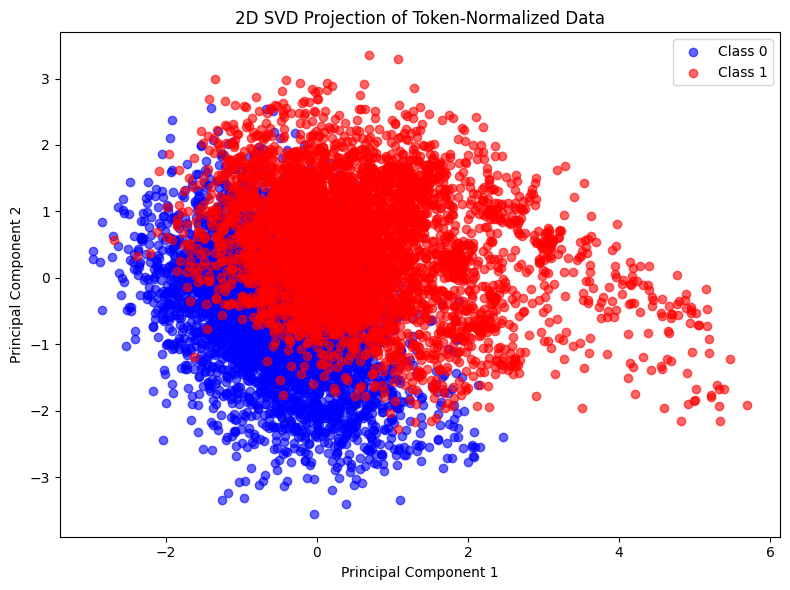

How well does each token difference align with LDA w
doing LDA


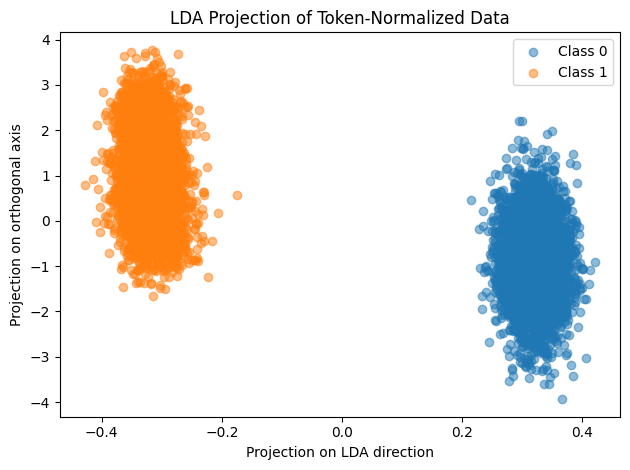

plotting 1d hists


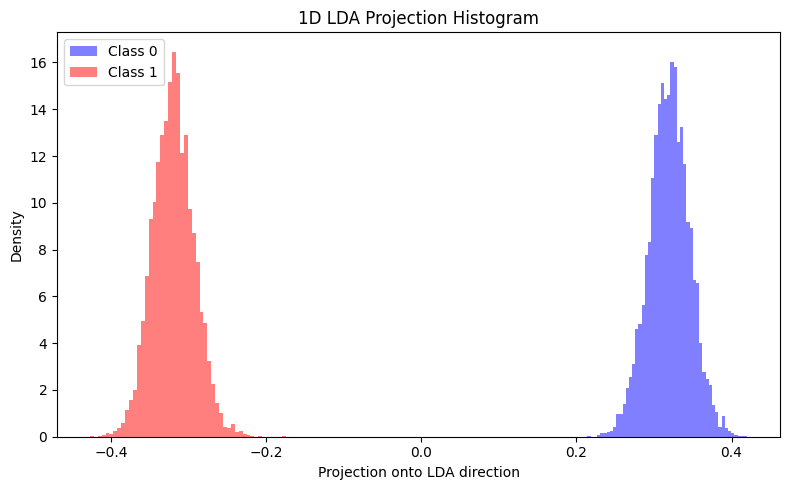

plotting 2d projection


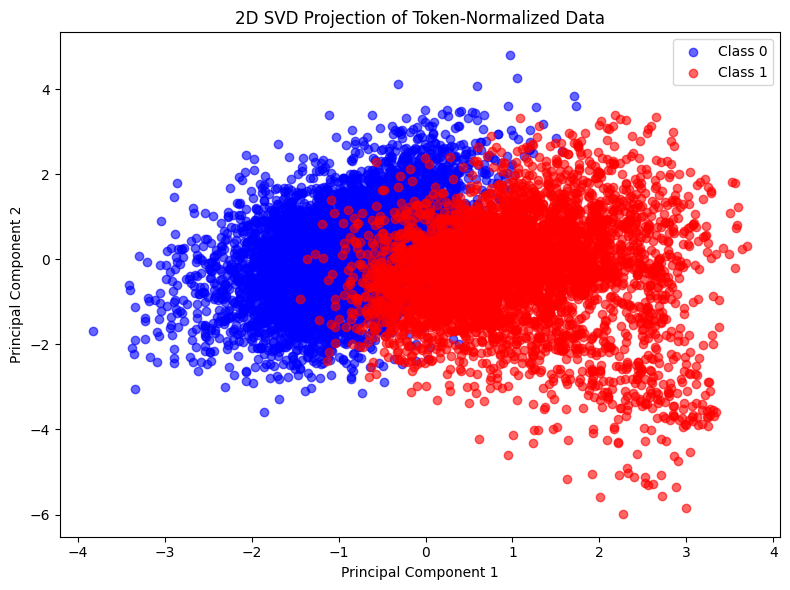

How well does each token difference align with LDA w
doing LDA


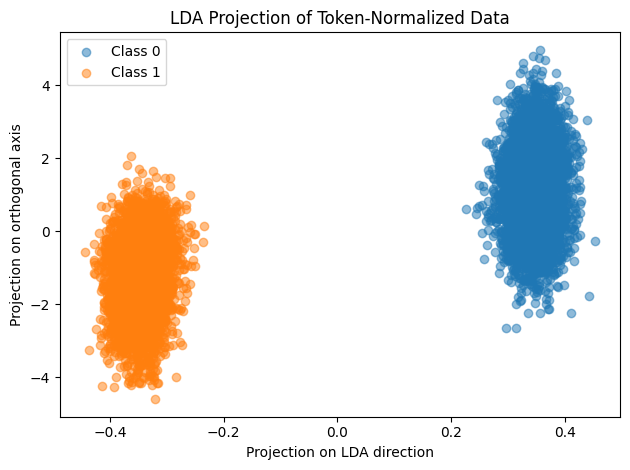

plotting 1d hists


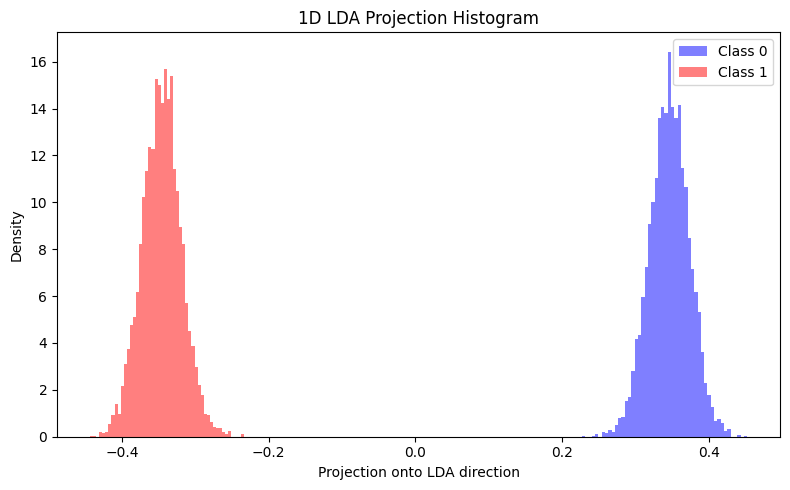

plotting 2d projection


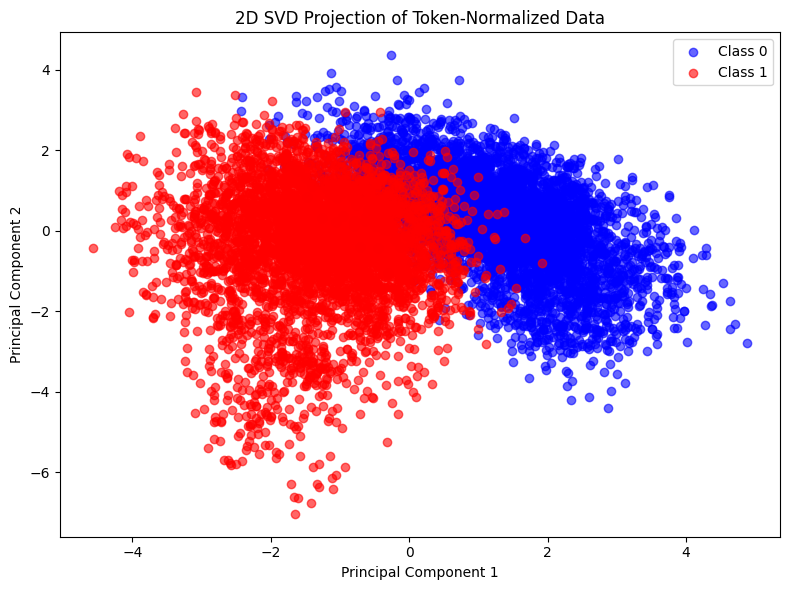

How well does each token difference align with LDA w
doing LDA


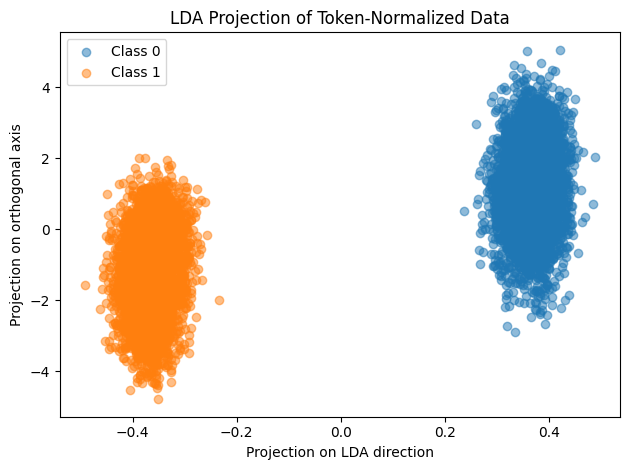

plotting 1d hists


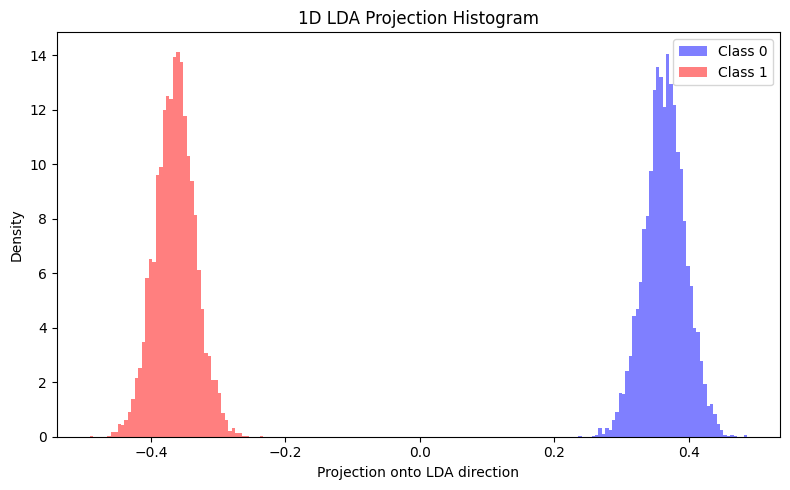

plotting 2d projection


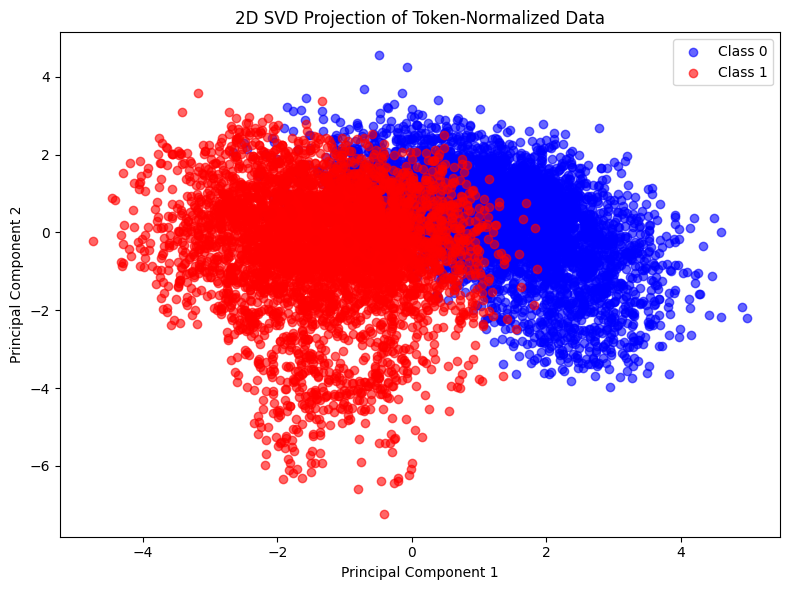

How well does each token difference align with LDA w
doing LDA


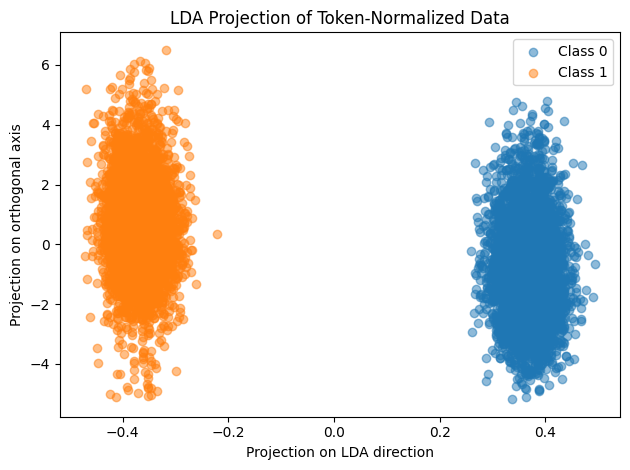

plotting 1d hists


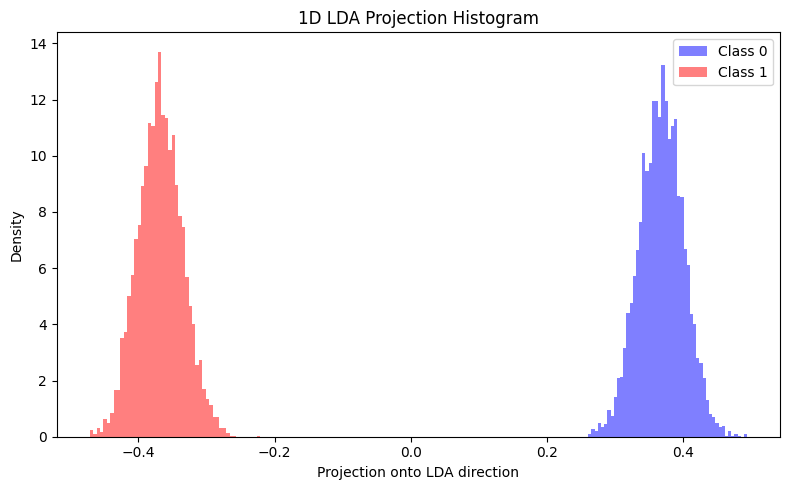

plotting 2d projection


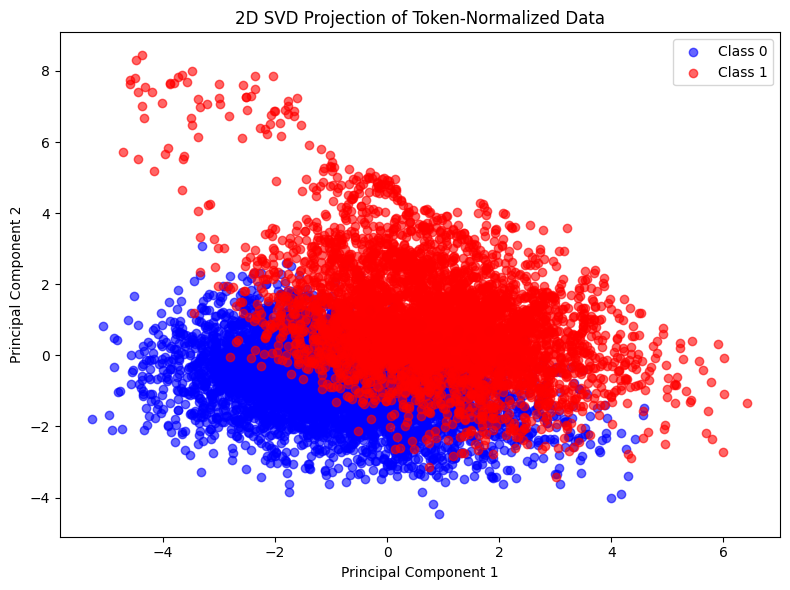

How well does each token difference align with LDA w
doing LDA


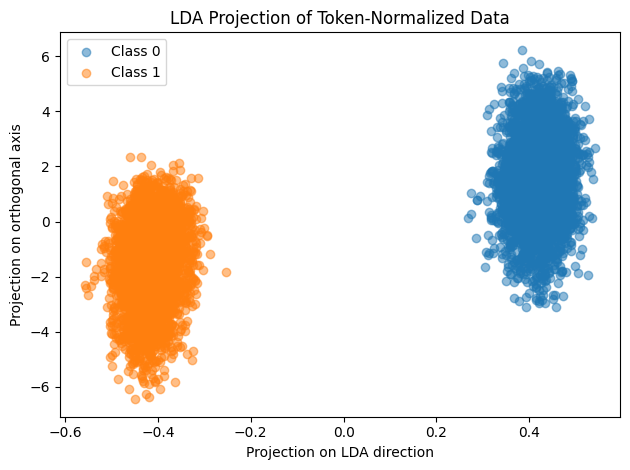

plotting 1d hists


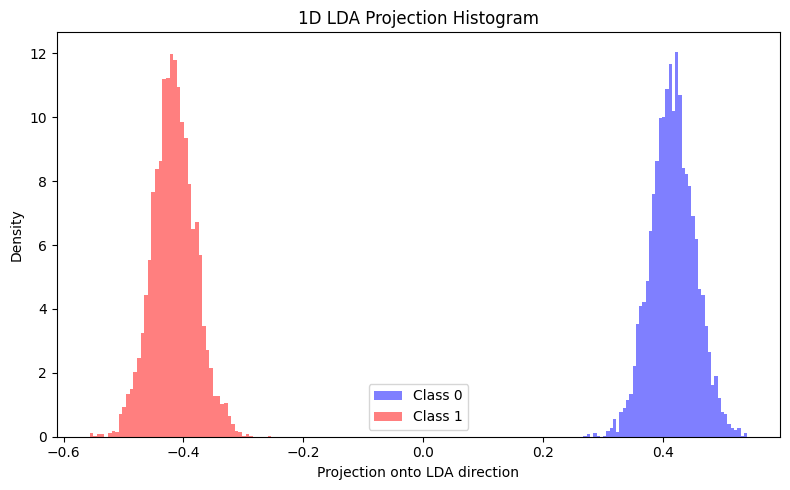

plotting 2d projection


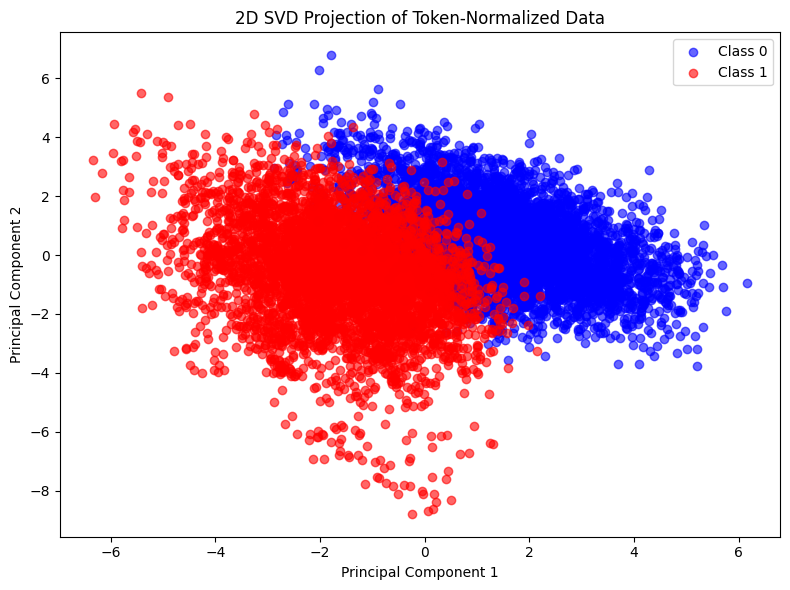

How well does each token difference align with LDA w
doing LDA


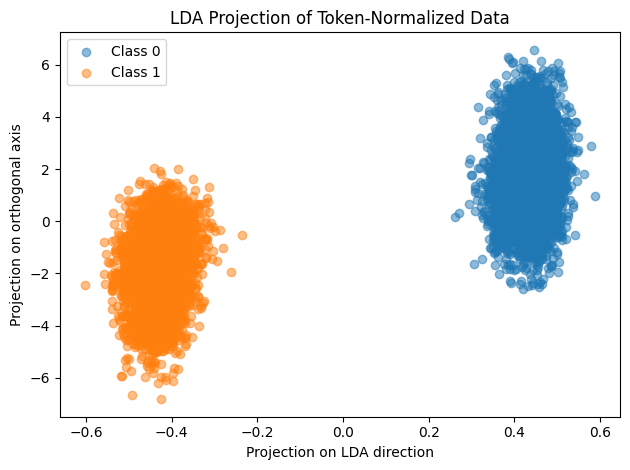

plotting 1d hists


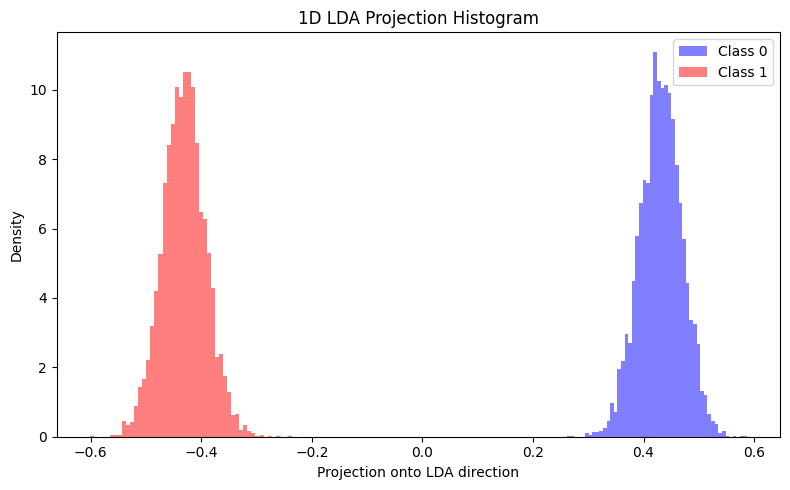

plotting 2d projection


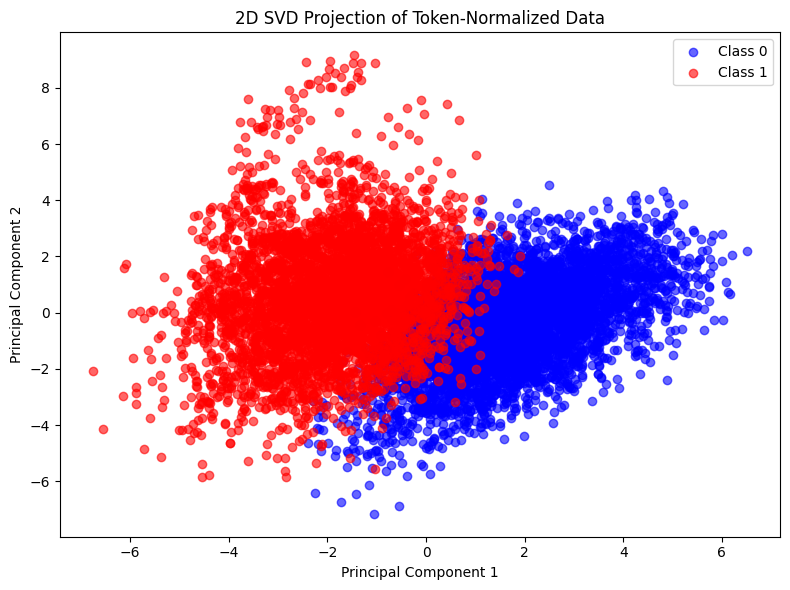

How well does each token difference align with LDA w
doing LDA


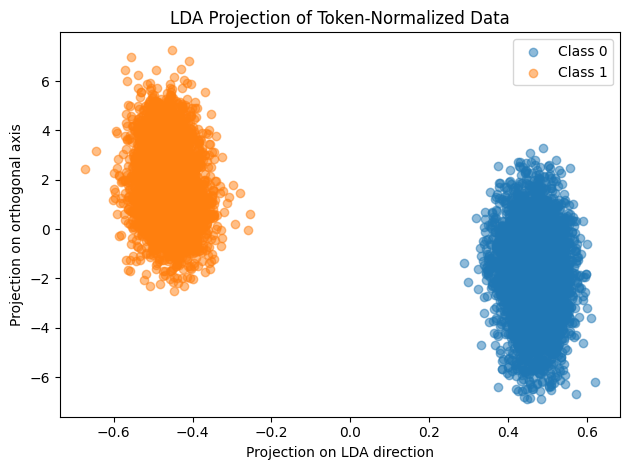

plotting 1d hists


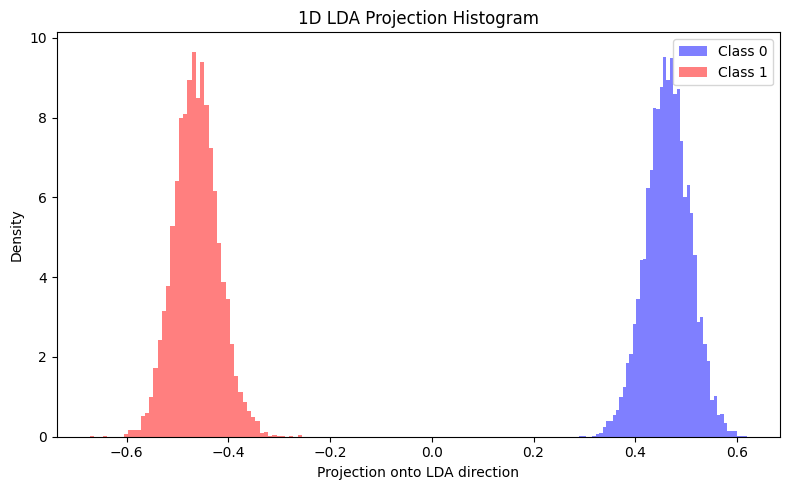

plotting 2d projection


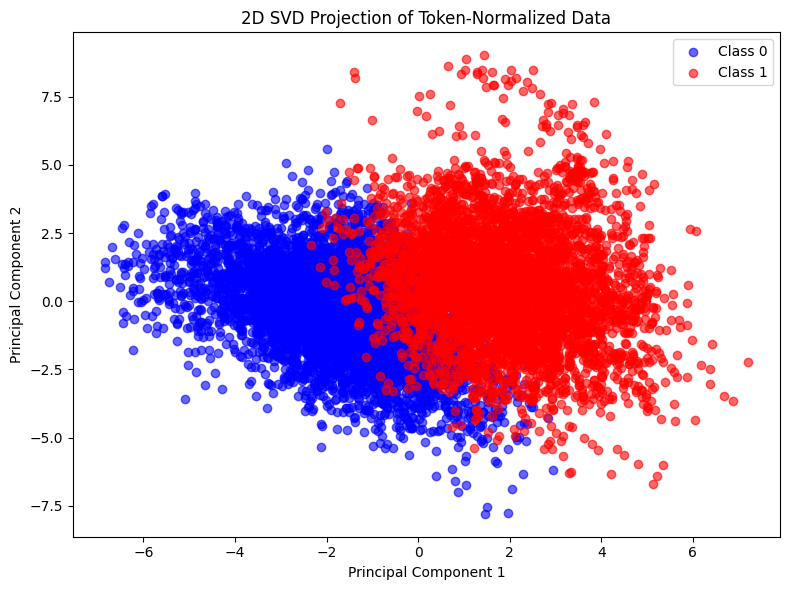

How well does each token difference align with LDA w
doing LDA


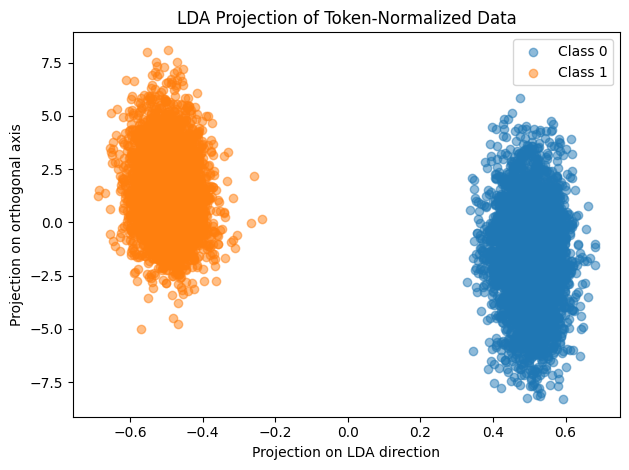

plotting 1d hists


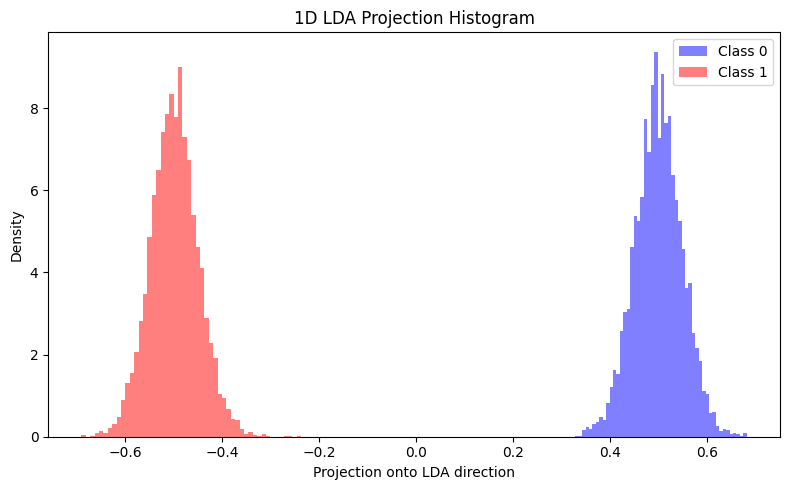

plotting 2d projection


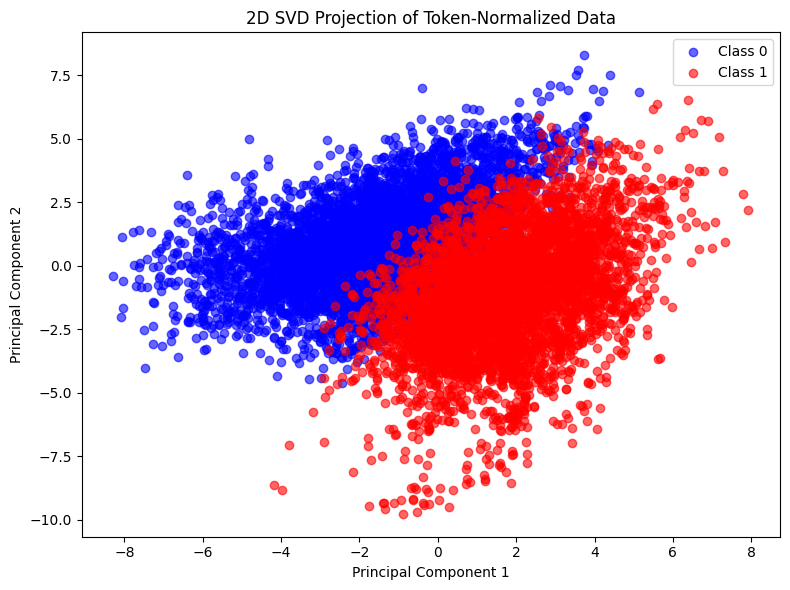

How well does each token difference align with LDA w
doing LDA


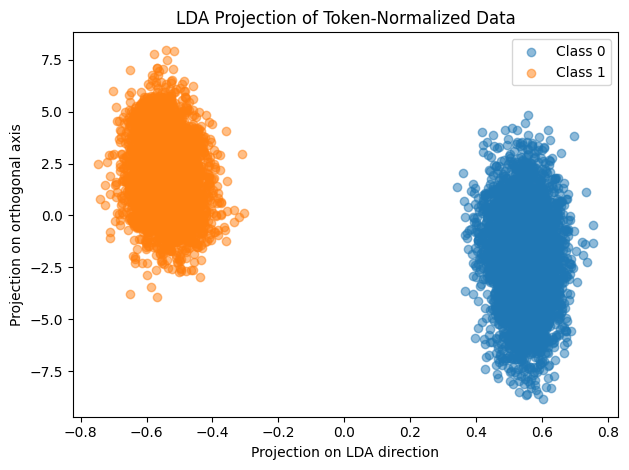

plotting 1d hists


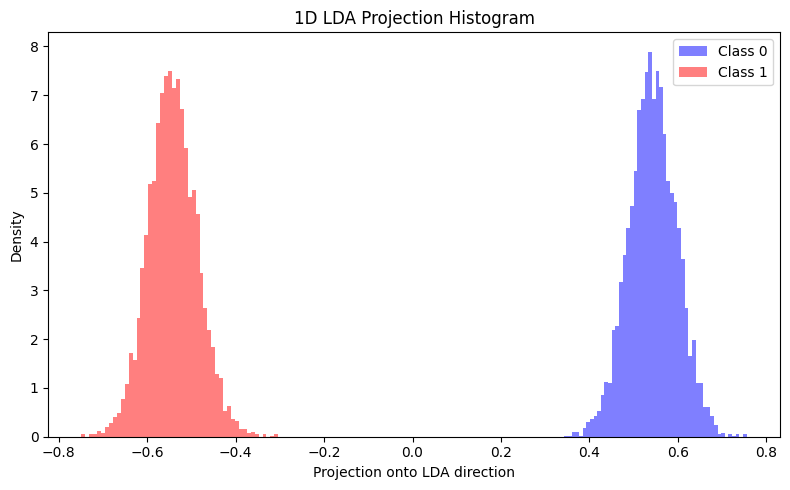

plotting 2d projection


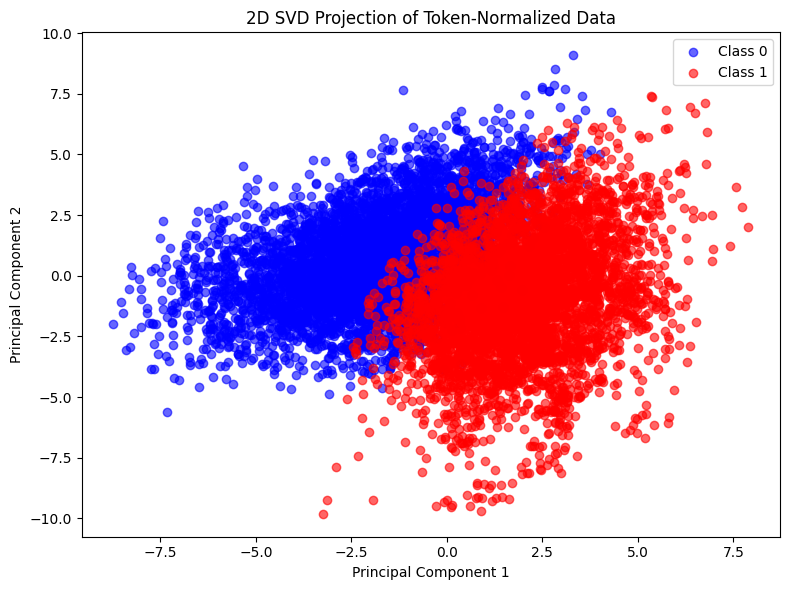

How well does each token difference align with LDA w
doing LDA


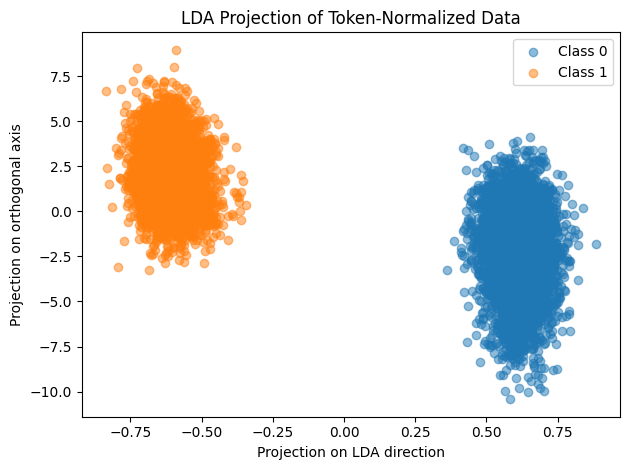

plotting 1d hists


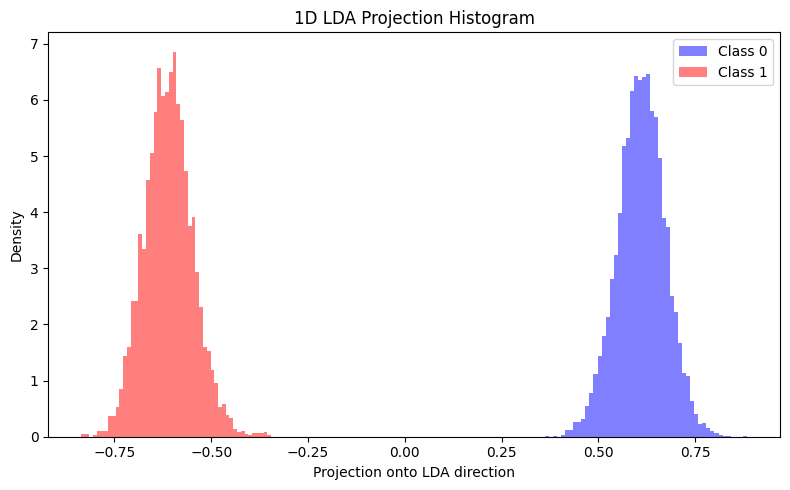

plotting 2d projection


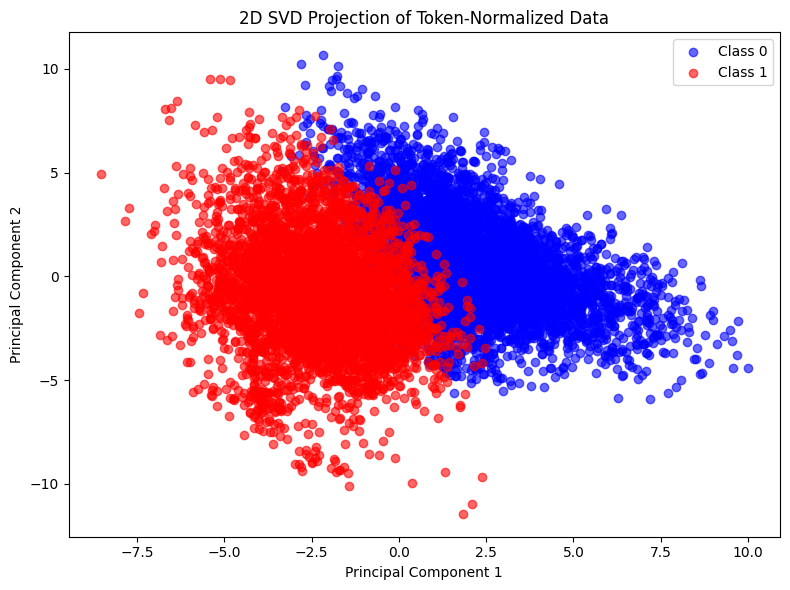

How well does each token difference align with LDA w
doing LDA


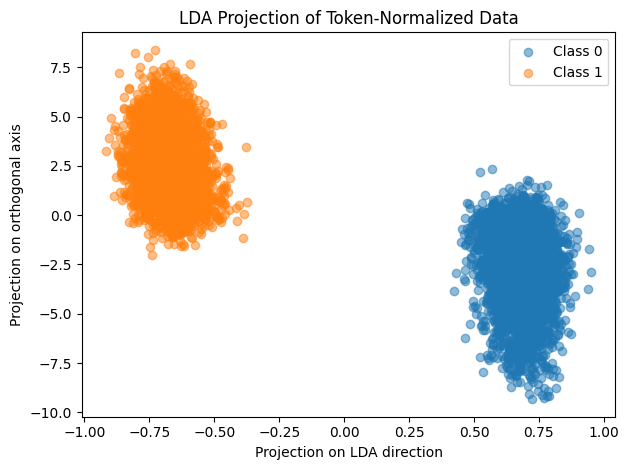

plotting 1d hists


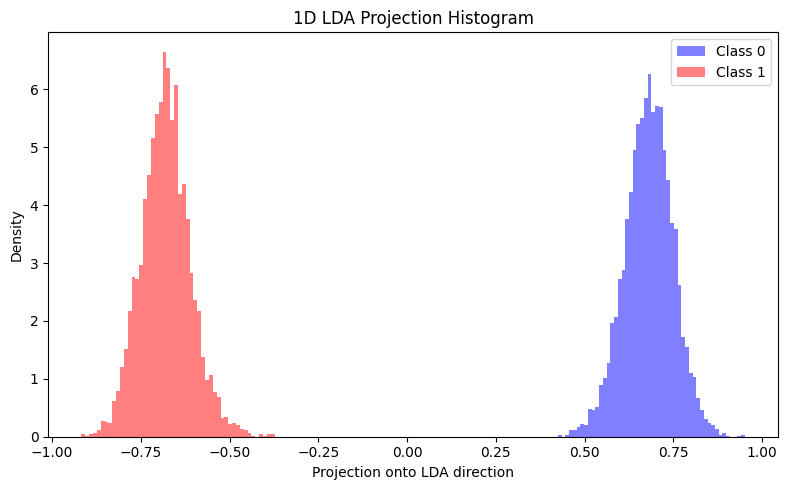

plotting 2d projection


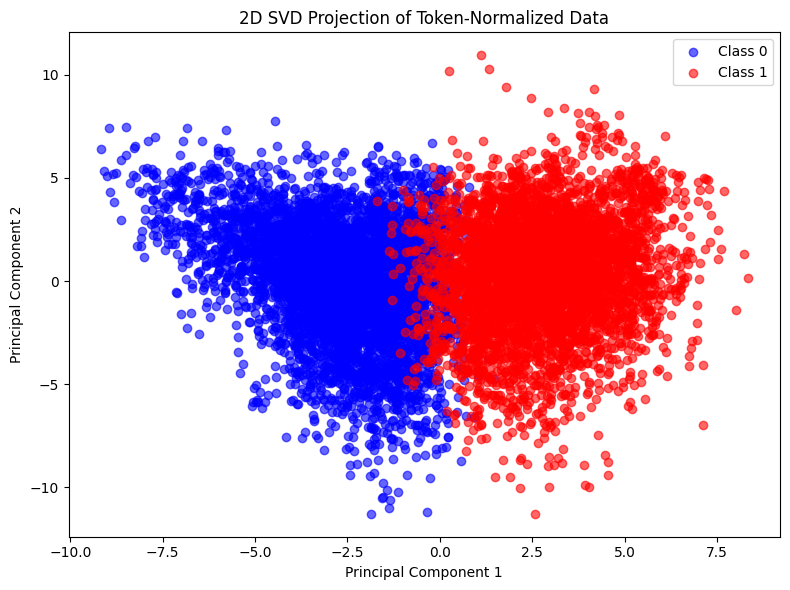

How well does each token difference align with LDA w
doing LDA


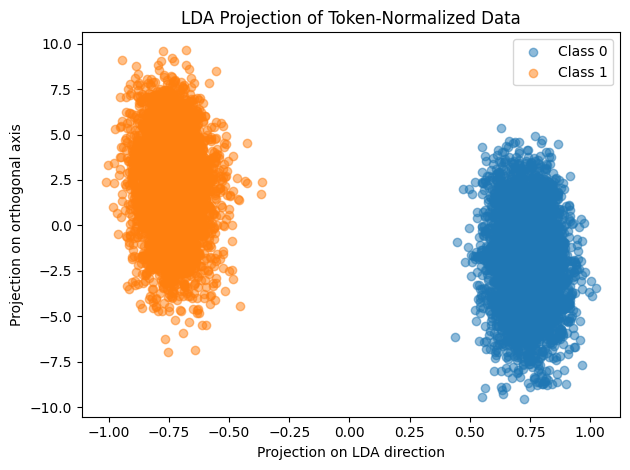

plotting 1d hists


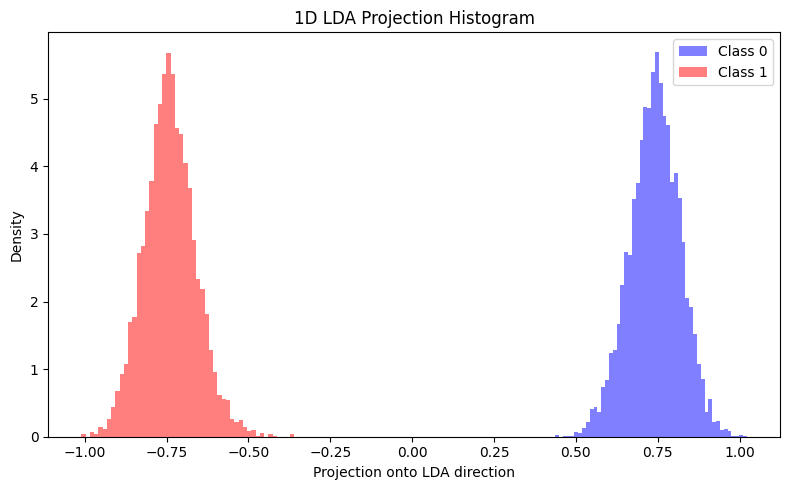

plotting 2d projection


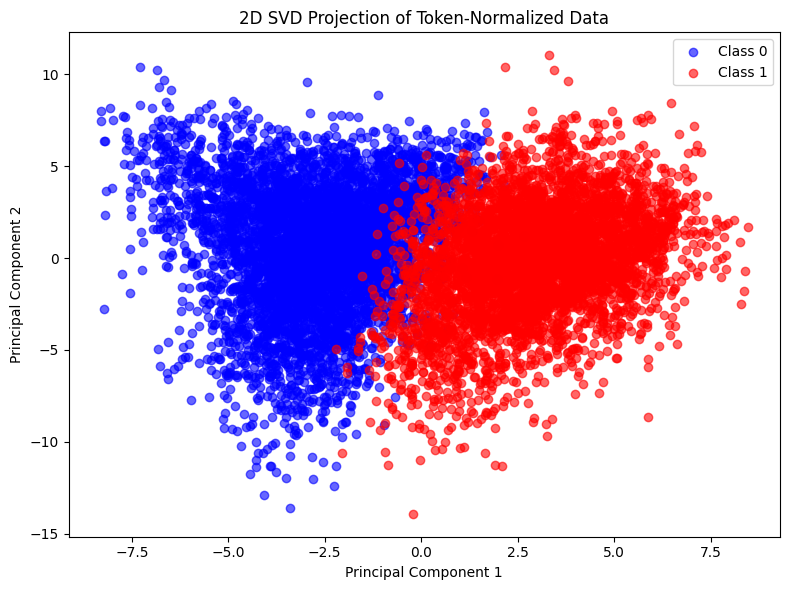

How well does each token difference align with LDA w
doing LDA


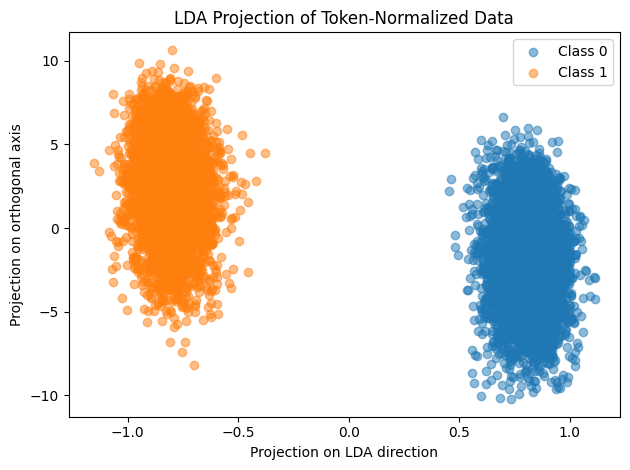

plotting 1d hists


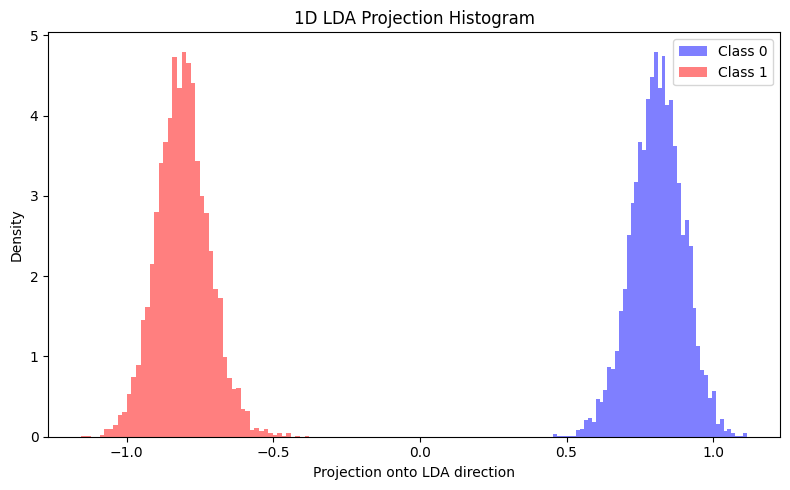

plotting 2d projection


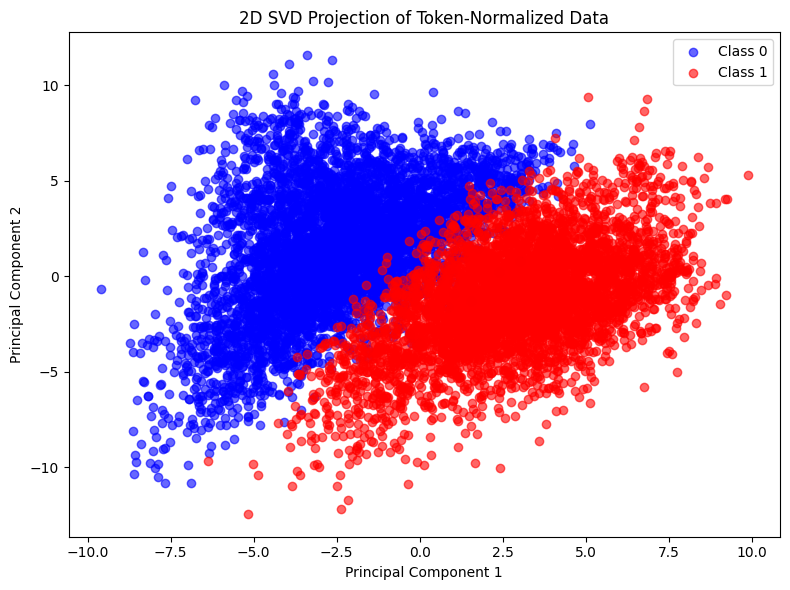

How well does each token difference align with LDA w
doing LDA


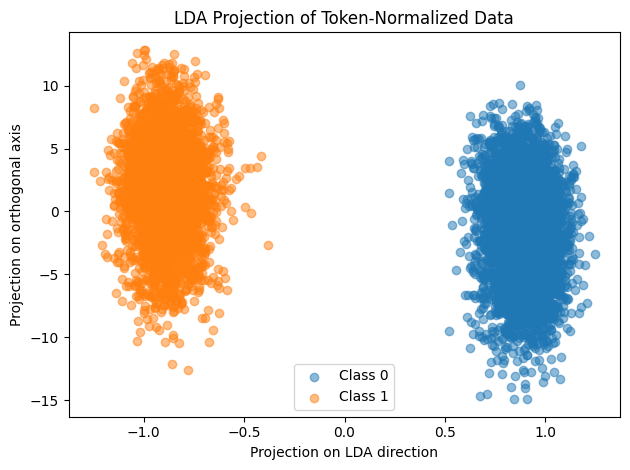

plotting 1d hists


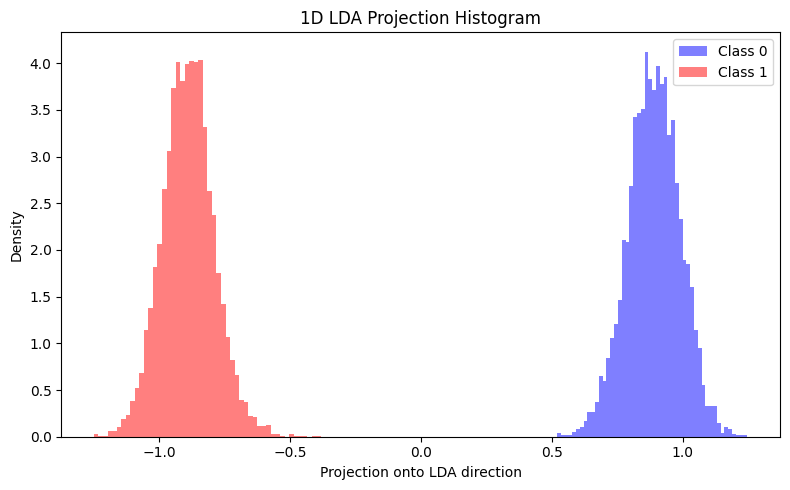

plotting 2d projection


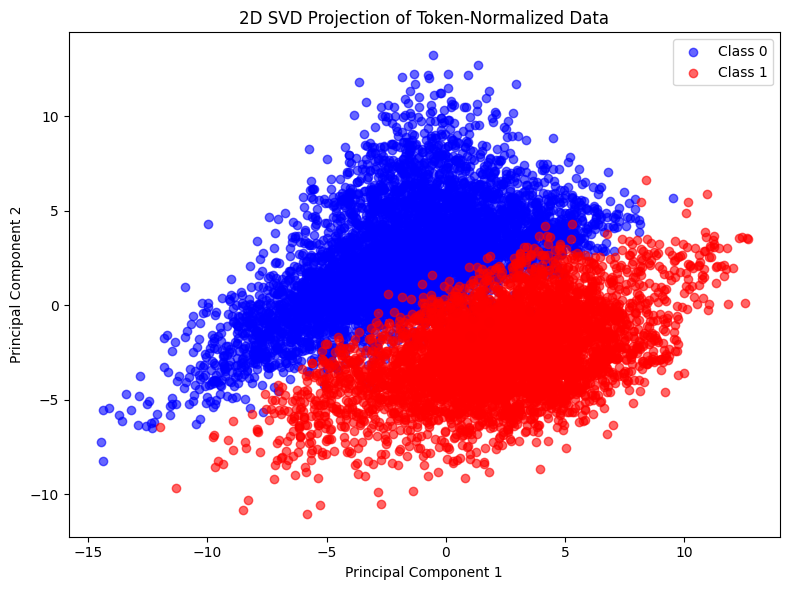

How well does each token difference align with LDA w
doing LDA


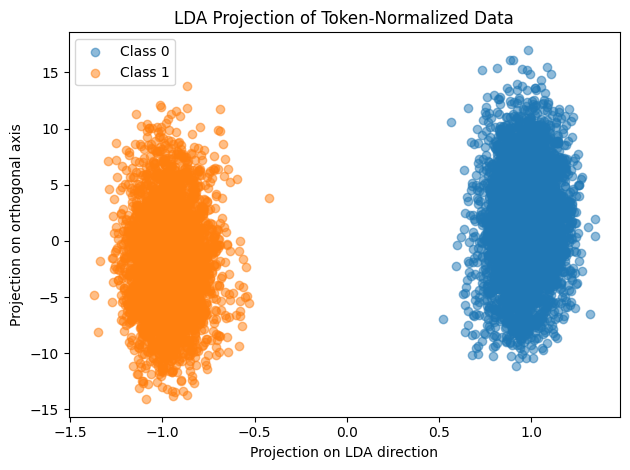

plotting 1d hists


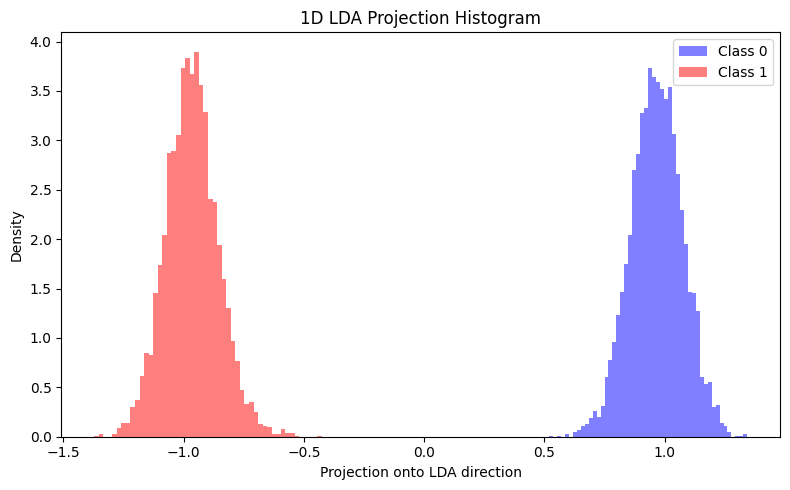

plotting 2d projection


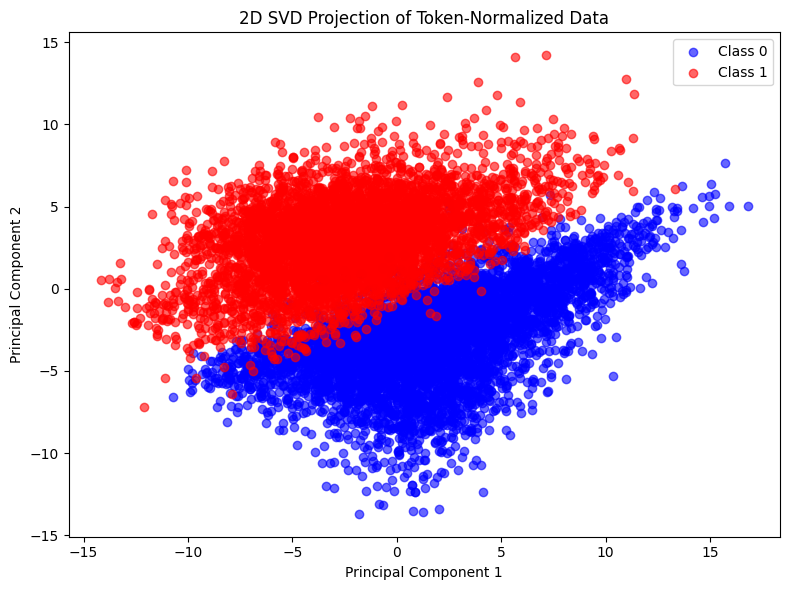

How well does each token difference align with LDA w
doing LDA


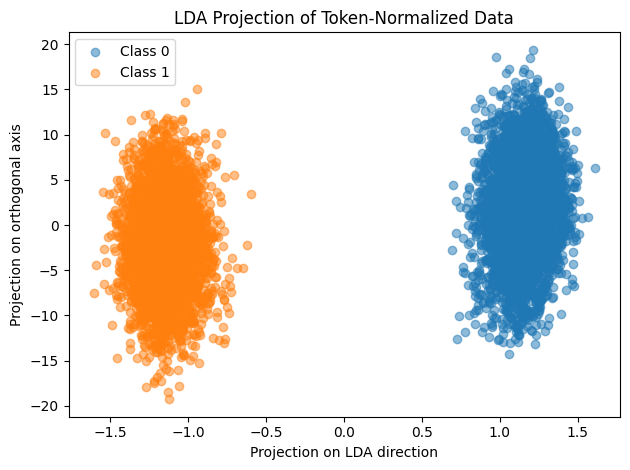

plotting 1d hists


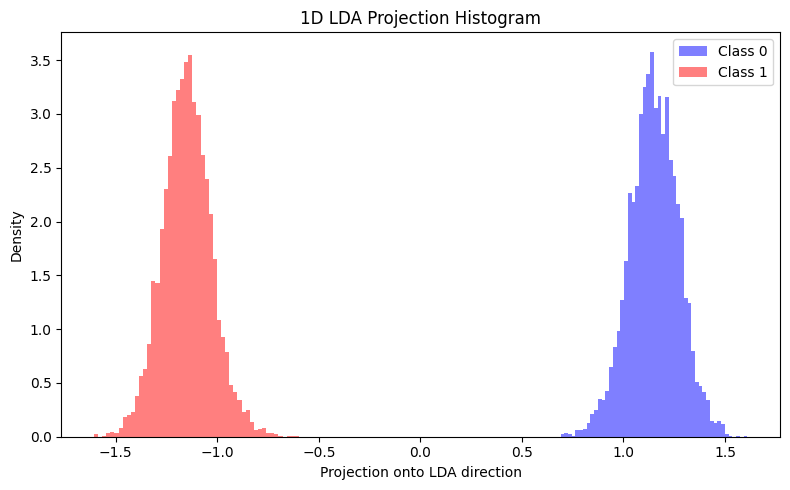

plotting 2d projection


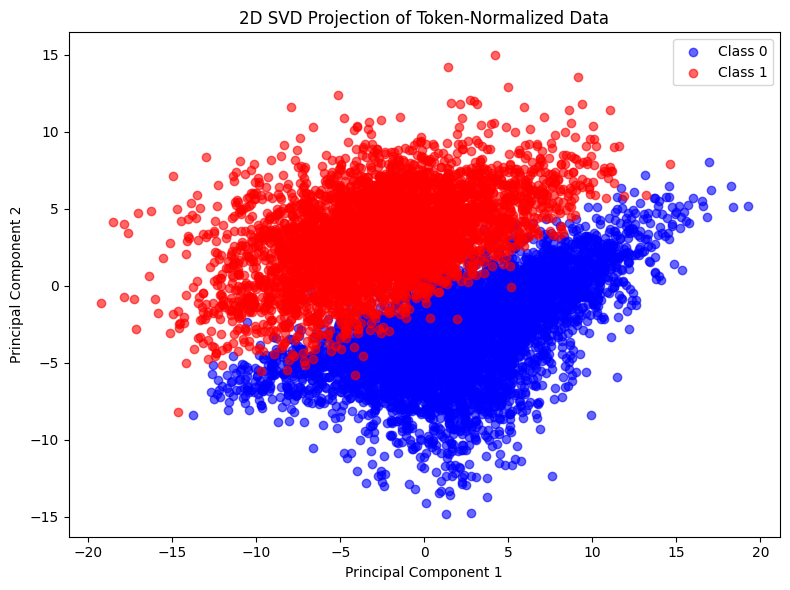

How well does each token difference align with LDA w
doing LDA


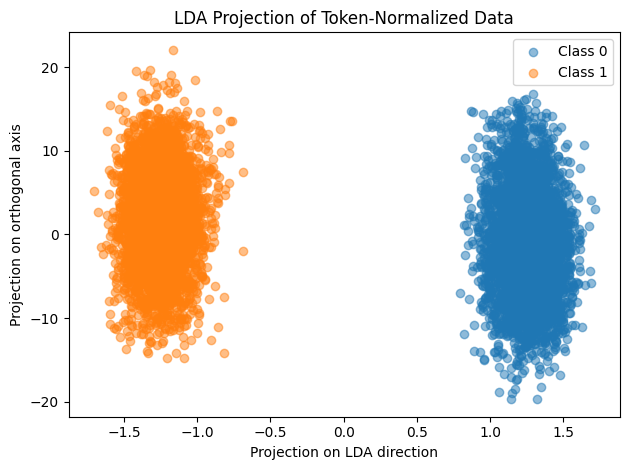

plotting 1d hists


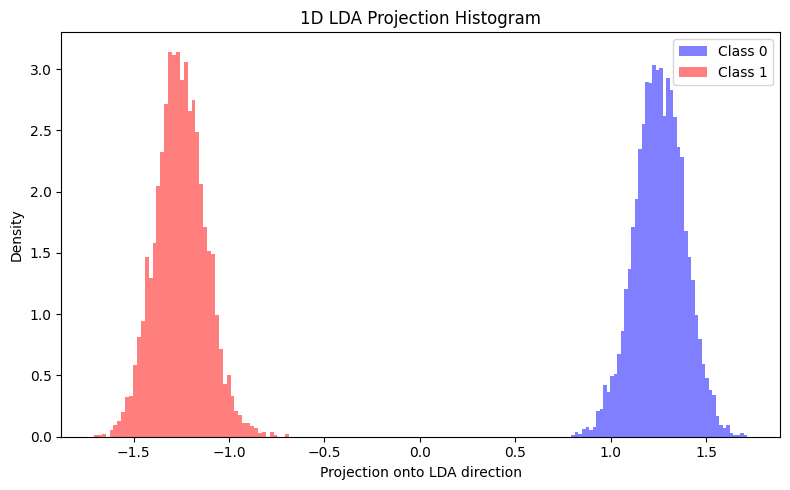

plotting 2d projection


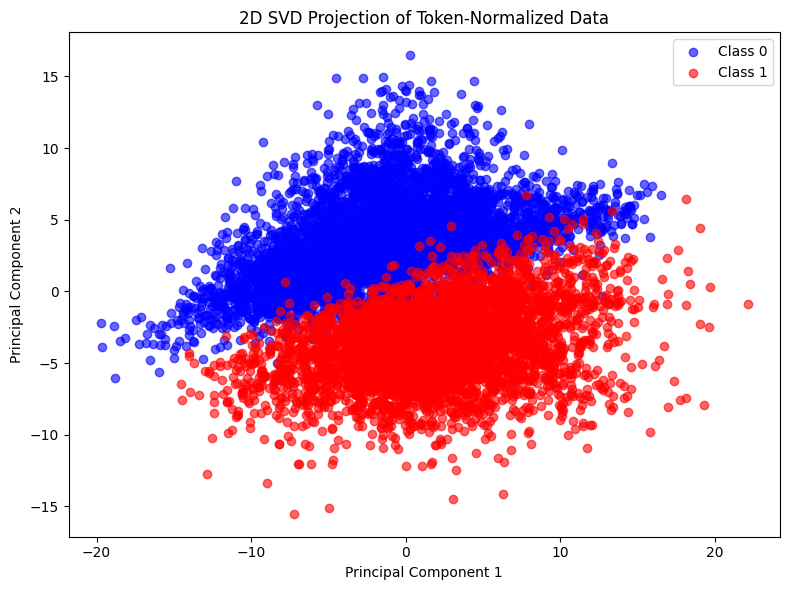

How well does each token difference align with LDA w
doing LDA


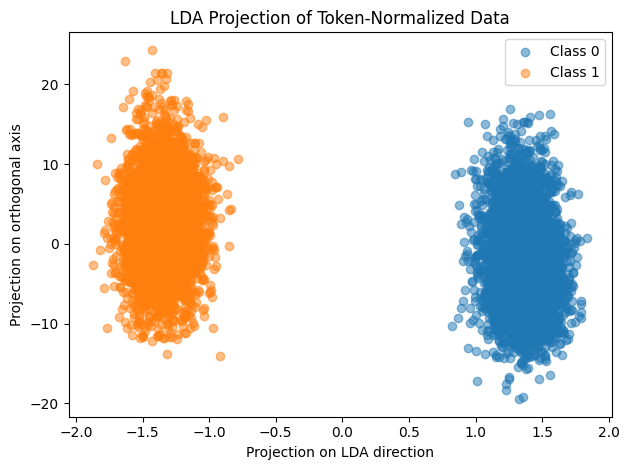

plotting 1d hists


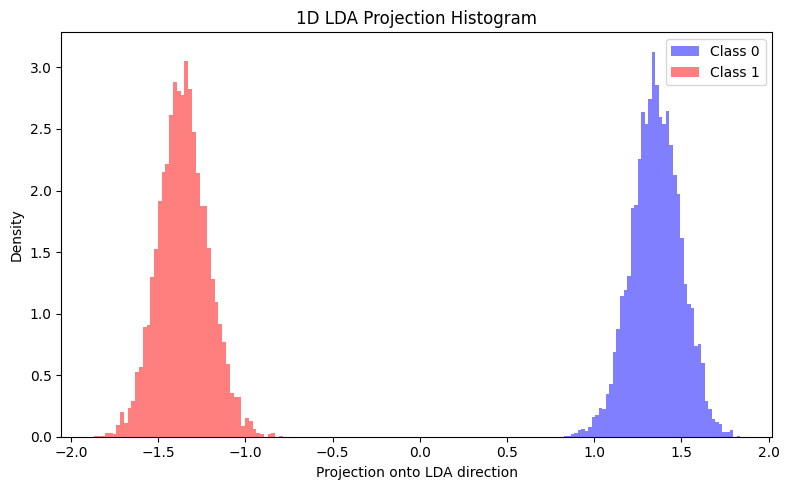

plotting 2d projection


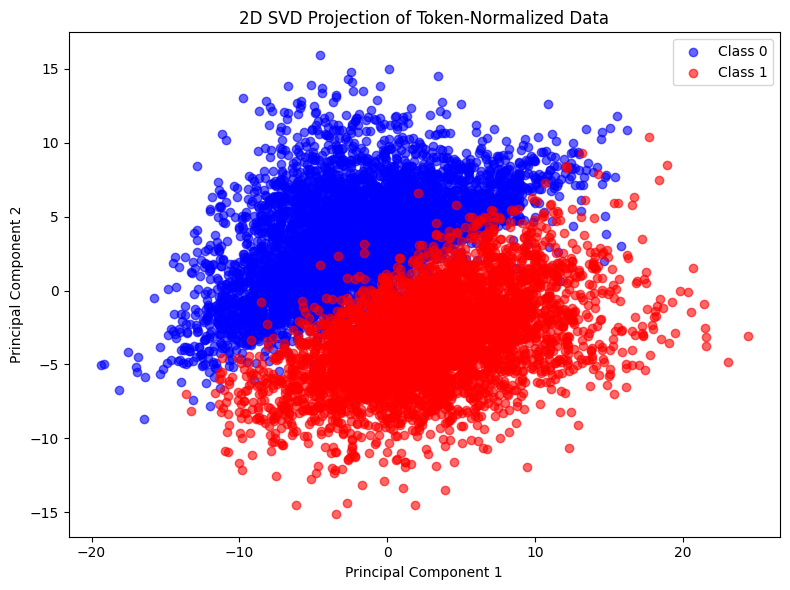

How well does each token difference align with LDA w
doing LDA


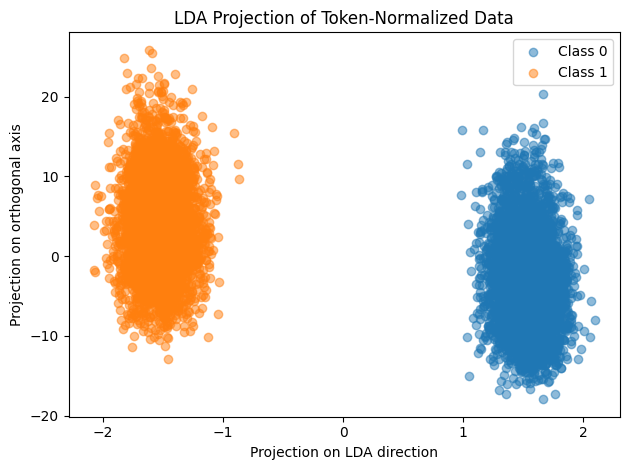

plotting 1d hists


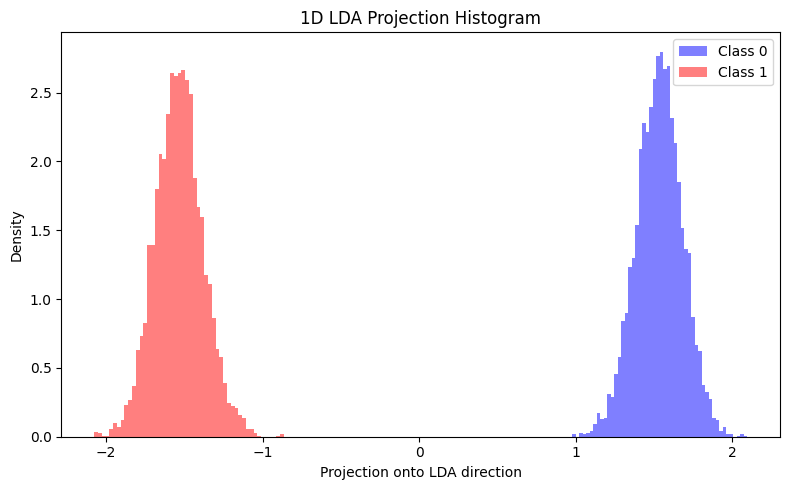

plotting 2d projection


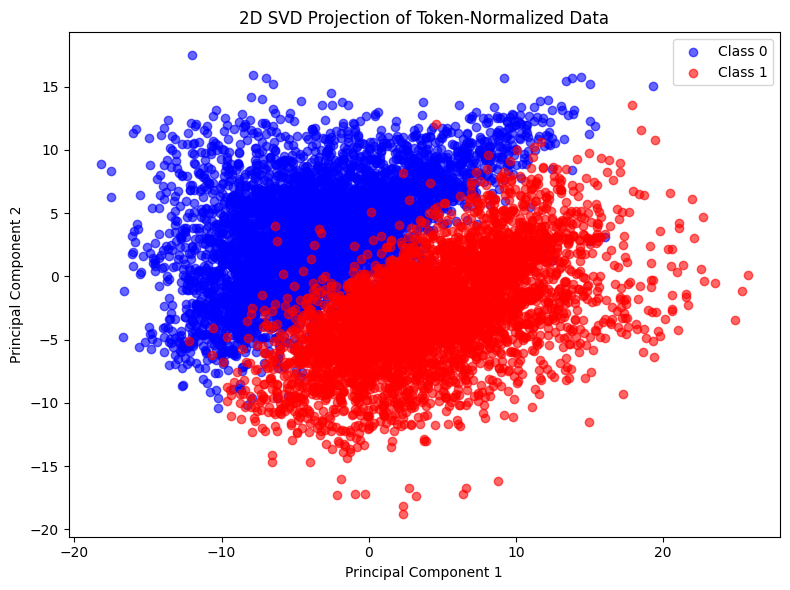

How well does each token difference align with LDA w


In [24]:
layerwise_analysis_results = [
    perform_token_normalized_analysis_suite(
        data_0 = {k:v[i] for k, v in output_think_dict.items()},
        data_1 = {k:v[i] for k, v in output_other_dict.items()},
        save_location = f"ablated_0_22_layer_{i}_analyses",
        descriptor=f"ablated_0_22_Layer {i} analysis"
    )
    for i in range(1, 32)
]

In [25]:
diffs = []
stds = []
for res in layerwise_analysis_results:
    p0 = np.load(res['lda']['projected_0_file'])
    p1 = np.load(res['lda']['projected_1_file'])

    diffs.append(np.abs(np.mean(p1)-np.mean(p0)))
    stds.append(np.sqrt(np.var(p1)+np.var(p0)))

diffs = np.array(diffs)
stds=np.array(stds)

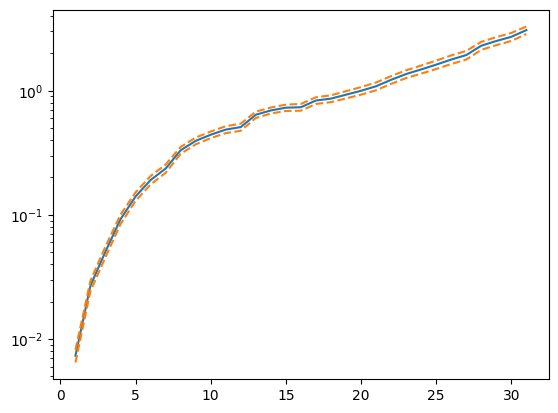

In [26]:

plt.plot(np.arange(1, 32), diffs)
plt.plot(np.arange(1, 32), diffs+stds, linestyle='dashed', color='tab:orange')
plt.plot(np.arange(1, 32), diffs-stds, linestyle='dashed', color='tab:orange')
plt.yscale("log")

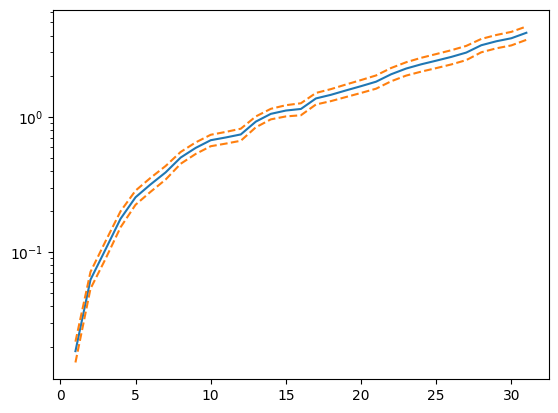

In [ ]:

plt.plot(np.arange(1, 32), diffs)
plt.plot(np.arange(1, 32), diffs+stds, linestyle='dashed', color='tab:orange')
plt.plot(np.arange(1, 32), diffs-stds, linestyle='dashed', color='tab:orange')
plt.yscale("log")

Let's plot the differences in the w vector over time 

In [27]:
w_vecs = []
for res in layerwise_analysis_results:
    w_vec = np.load(res['lda']['w_file'])
    w_vecs.append(w_vec)

w_vecs = np.array(w_vecs)

# compute differences to oberse changes over time in the vector 

angles = []
for i in range(1, len(w_vecs)):
    pw = w_vecs[i-1]
    cw = w_vecs[i]
    angle = np.arccos(pw@cw)
    angles.append(angle)

angles=np.array(angles)

# let's weight the angle by the "volume" of vectors at that angle
# this is the volume of a d-1 dimensional sphere with radius sin(theta)
import math

def log_ring_length(d, theta):
    """
    Computes log of the (d−1)-dimensional 'ring measure' on the unit d-sphere
    at polar angle theta (0 < theta < pi).

    ring_measure = Omega_{d-1} * [sin(theta)]^(d-1),
    where
    Omega_{d-1} = 2 * pi^(d/2) / Gamma(d/2).

    Returns ln(ring_measure).
    """
    if not (0 < theta < math.pi):
        raise ValueError("theta must be in (0, pi).")

    # log(Omega_{d-1}) = ln(2) + (d/2)*ln(pi) - lgamma(d/2)
    log_omega = (
        math.log(2.0)
        + (d / 2.0) * math.log(math.pi)
        - math.lgamma(d / 2.0)
    )
    # log(ring_measure) = log(Omega_{d-1}) + (d-1)*ln(sin(theta))
    return log_omega + (d - 1) * math.log(math.sin(theta))

magnitude_change = np.array([log_ring_length(d=4096, theta=angle) for angle in angles])


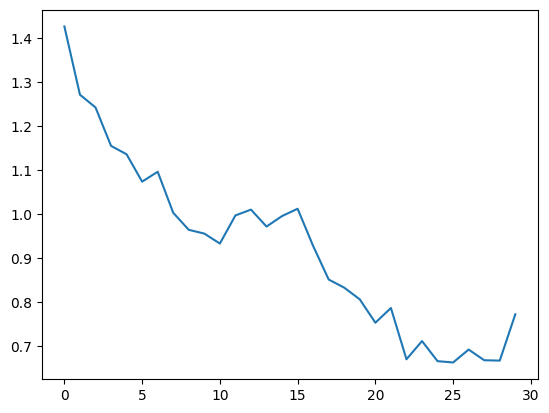

In [28]:
plt.plot(angles)

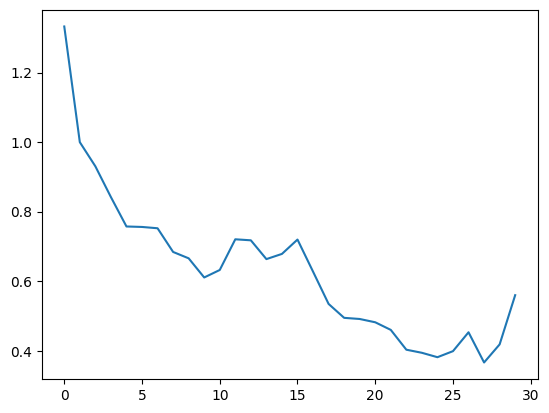

In [ ]:
plt.plot(angles)

In [ ]:
np.exp(log_ring_length(d=3, theta=np.pi/2))

np.float64(12.566370614359178)

In [ ]:
perform_token_normalized_analysis_suite(
        data_0 = {k:v[0] for k, v in output_think_dict.items()},
        data_1 = {k:v[0] for k, v in output_other_dict.items()},
        save_location = f"layer_{0}_analyses",
        descriptor=f"Layer {0} analysis"
    )

doing LDA


ValueError: Computed LDA vector has zero magnitude.

Let's plot some salient things 

w vector magnitude

cosine similarity of w vectors, layer by layer 

In [ ]:
cos_sims = np.zeros((len(layerwise_analysis_results), len(layerwise_analysis_results)))

for i in range(len(layerwise_analysis_results)):
    for j in range(i, len(layerwise_analysis_results)):
        # compute pairwise cosine sim
        cur_cos_sim = np.sum(
            np.load(layerwise_analysis_results[i]['lda']['w_file'])*np.load(layerwise_analysis_results[j]['lda']['w_file'])
        )
        cos_sims[i][j]=cur_cos_sim
        cos_sims[j][i]=cur_cos_sim

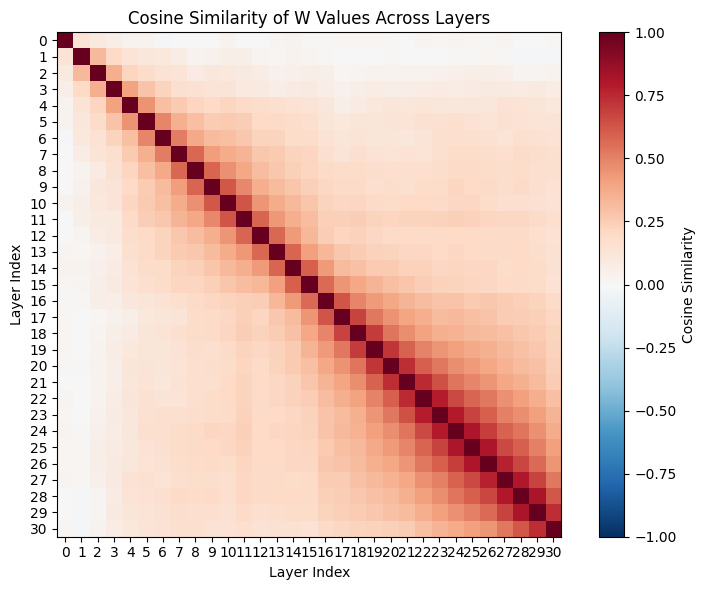

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
    
# Create the heatmap
im = ax.imshow(cos_sims, cmap='RdBu_r', vmin=-1, vmax=1)

# Add colorbar
cbar = plt.colorbar(im)
cbar.set_label('Cosine Similarity')

# Set ticks and labels
n = len(cos_sims)
ax.set_xticks(np.arange(n))
ax.set_yticks(np.arange(n))

# Add title and labels
ax.set_title('Cosine Similarity of W Values Across Layers')
ax.set_xlabel('Layer Index')
ax.set_ylabel('Layer Index')

# Make it square
plt.tight_layout()



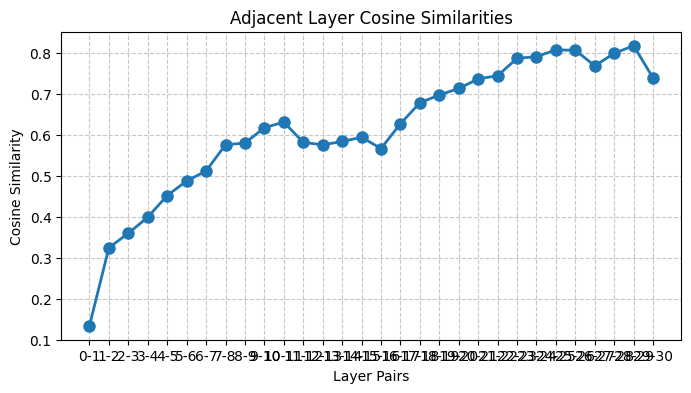

In [ ]:
n = len(cos_sims)
adjacent_sims = [cos_sims[i, i+1] for i in range(n-1)]

# Create x-axis for layer pairs
x = np.arange(len(adjacent_sims))
x_labels = [f"{i}-{i+1}" for i in range(n-1)]

# Plot
plt.figure(figsize=(8, 4))
plt.plot(x, adjacent_sims, 'o-', linewidth=2, markersize=8)

# Customize plot
plt.xlabel('Layer Pairs')
plt.ylabel('Cosine Similarity')
plt.title('Adjacent Layer Cosine Similarities')
plt.xticks(x, x_labels)
plt.grid(True, linestyle='--', alpha=0.7)



In [ ]:
jhg

NameError: name 'jhg' is not defined

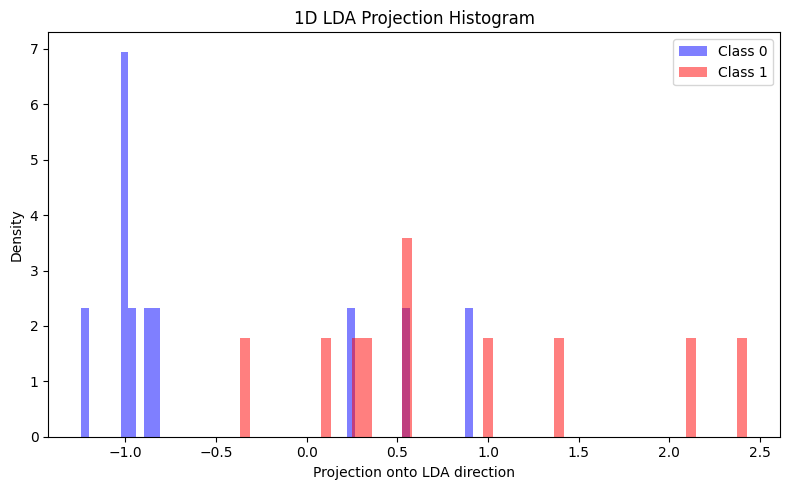

In [ ]:
plot_lda_1d_histograms(projected_0 = np.random.randn(10)-.5,
                            projected_1 = np.random.randn(10)+.5)

In [ ]:
# in common? 

words = [] 

for k in output_think_dict:
    if k in output_other_dict:
        words.append((k, min(output_think_dict[k][0].shape[0], output_other_dict[k][0].shape[0])))

In [ ]:
words.sort(key = lambda x: -x[-1])

for w in words:
    print(w)

((' ', 220), 227)
((' the', 279), 176)
(('.', 13), 117)
(('{', 90), 94)
((' of', 315), 83)
(('2', 17), 73)
(('3', 18), 71)
((',', 11), 61)
((' =', 284), 54)
((':', 25), 51)
((' is', 374), 42)
(('frac', 38118), 41)
((' \\', 1144), 41)
(('1', 16), 39)
(('}{', 15523), 38)
((' to', 311), 37)
((' \\(', 18240), 36)
(('8', 23), 32)
((' by', 555), 29)
(('6', 21), 29)
((' for', 369), 27)
((' total', 2860), 26)
((' a', 264), 25)
(('.\n\n', 382), 25)
(('4', 19), 25)
(('5', 20), 22)
((')', 8), 19)
((' find', 1505), 19)
((' these', 1521), 18)
((' number', 1396), 17)
((' and', 323), 17)
(('12', 717), 16)
(('7', 22), 16)
(('To', 1271), 15)
((' days', 2919), 14)
(('{\\', 36802), 14)
((' (', 320), 14)
((' +', 489), 13)
((' The', 578), 13)
((' y', 379), 13)
(('-', 12), 13)
((':\n\n', 1473), 13)
((' length', 3160), 13)
((' determine', 8417), 13)
((':\n', 512), 13)
(('boxed', 80175), 12)
((' sides', 11314), 12)
(('0', 15), 12)
(('\\', 59), 12)
((' in', 304), 12)
((' x', 865), 12)
((' when', 994), 11)
((' 

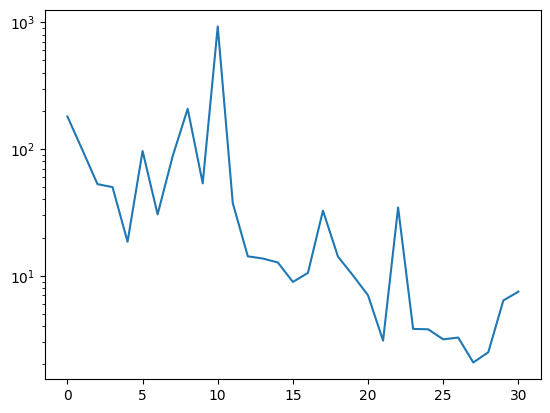

In [ ]:
plt.plot([v[-1] for v in layerwise_LDA_results])
plt.yscale("log")

In [ ]:
layerwise_LDA_results[0]

(array([ 0.00311734, -0.01863096,  0.0118199 , ..., -0.00867009,
        -0.02950646, -0.01085656], shape=(4096,), dtype=float32),
 array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         9.5693395e-06, -2.0946609e-05, -2.6840600e-05],
       shape=(21111,), dtype=float32),
 array([0.000000e+00, 0.000000e+00, 0.000000e+00, ..., 9.569339e-06,
        9.569339e-06, 9.569339e-06], shape=(4327,), dtype=float32),
 np.float32(64.005775),
 np.float32(180.44247))

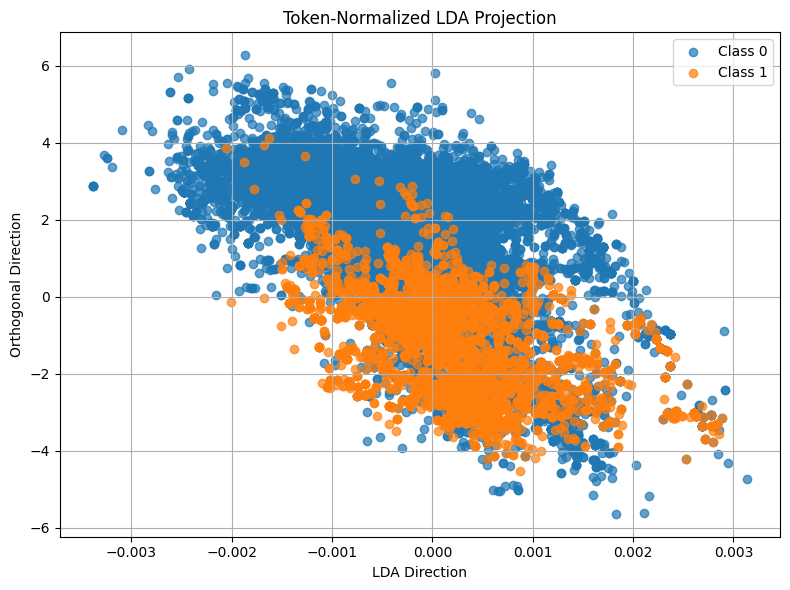

(array([ 0.0016406 , -0.01322602,  0.01165712, ...,  0.01126911,
         0.00273293, -0.00786139], shape=(4096,), dtype=float32),
 array([ 0.        ,  0.        ,  0.        , ...,  0.00025216,
        -0.00086708, -0.00173929], shape=(21111,), dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.00025216, 0.00025216,
        0.00025216], shape=(4327,), dtype=float32),
 np.float32(64.013664),
 np.float32(926.2042))

In [ ]:
perform_token_normalized_lda(
        data_0 = {k:v[11] for k, v in output_think_dict.items()},
        data_1 = {k:v[11] for k, v in output_other_dict.items()},
        visualize=True
    )

In [ ]:
jhgjhg

NameError: name 'jhgjhg' is not defined

In [ ]:
think_dict, other_dict = extract_reasoning_data(llama, "briefly, what is the square root of 9", think_pad=0)

2025-03-27 07:21:55,345 0b570dc8-f3e8-43c8-bbaf-e91a2505bd98 - RECEIVED: Your job has been received and is waiting approval.
2025-03-27 07:21:57,413 0b570dc8-f3e8-43c8-bbaf-e91a2505bd98 - APPROVED: Your job was approved and is waiting to be run.
2025-03-27 07:22:02,914 0b570dc8-f3e8-43c8-bbaf-e91a2505bd98 - RUNNING: Your job has started running.
2025-03-27 07:22:41,343 0b570dc8-f3e8-43c8-bbaf-e91a2505bd98 - COMPLETED: Your job has been completed.


[[('\n', 198), ('To', 1271), (' determine', 8417), (' the', 279), (' square', 9518), (' root', 3789), (' of', 315), (' ', 220), ('9', 24), (',', 11), (' I', 358), (' first', 1176), (' recall', 19635), (' that', 430), (' a', 264), (' square', 9518), (' root', 3789), (' of', 315), (' a', 264), (' number', 1396), (' finds', 14035), (' a', 264), (' value', 907), (' that', 430), (',', 11), (' when', 994), (' multiplied', 56016), (' by', 555), (' itself', 5196), (',', 11), (' gives', 6835), (' the', 279), (' original', 4113), (' number', 1396), ('.', 13), (' For', 1789), (' ', 220), ('9', 24), (',', 11), (' this', 420), (' means', 3445), (' finding', 9455), (' a', 264), (' number', 1396), (' that', 430), (',', 11), (' when', 994), (' squared', 53363), (',', 11), (' equals', 17239), (' ', 220), ('9', 24), ('.\n\n', 382), ('I', 40), (' start', 1212), (' by', 555), (' testing', 7649), (' the', 279), (' number', 1396), (' ', 220), ('3', 18), ('.', 13), (' Squ', 20685), ('aring', 3329), (' ', 220

In [ ]:
"""
Reasoning Prompts Reader

This script reads a list of reasoning prompts from a text file and creates a Python list.
The prompts are categorized into math, English, world history, and science questions.
"""

def read_prompts(file_path="reasoning_prompts.txt"):
    """
    Read prompts from a text file and return them as a list of strings.
    
    Args:
        file_path (str): Path to the file containing reasoning prompts
        
    Returns:
        list: A list of strings, each containing a reasoning prompt
    """
    prompts = []
    
    try:
        with open(file_path, 'r', encoding='utf-8') as file:
            for line in file:
                # Skip empty lines, headers, and category labels
                line = line.strip()
                if (line and 
                    not line.startswith('#') and 
                    not line.startswith('##') and
                    not line == ""):
                    
                    # Extract the prompt text by removing the number and period
                    parts = line.split('. ', 1)
                    if len(parts) > 1 and parts[0].isdigit():
                        prompt = parts[1]
                    else:
                        prompt = line
                        
                    prompts.append(prompt)
    except FileNotFoundError:
        print(f"Error: File '{file_path}' not found.")
    except Exception as e:
        print(f"Error reading prompts: {e}")
    
    return prompts

def get_prompts_by_category():
    """
    Get prompts organized by category
    
    Returns:
        dict: A dictionary with categories as keys and lists of prompts as values
    """
    all_prompts = read_prompts()
    
    # Define the prompt ranges for each category based on the numbering in the file
    categories = {
        "math": all_prompts[0:62],
        "english": all_prompts[62:124],
        "world_history": all_prompts[124:186],
        "science": all_prompts[186:250]
    }
    
    return categories

In [ ]:
think_dict

{('To',
  1271): [tensor([[-0.0014,  0.0012,  0.0009,  ..., -0.0043,  0.0015,  0.0015]],
         dtype=torch.bfloat16), tensor([[ 0.0020, -0.0159, -0.0067,  ..., -0.0184,  0.0002, -0.0004]],
         dtype=torch.bfloat16), tensor([[ 0.0048, -0.0114, -0.0161,  ..., -0.0223,  0.0028, -0.0054]],
         dtype=torch.bfloat16), tensor([[-0.0013, -0.0101,  0.0204,  ..., -0.0591,  0.0099, -0.0273]],
         dtype=torch.bfloat16), tensor([[ 0.0176, -0.0576,  0.0366,  ..., -0.0962,  0.0591, -0.0417]],
         dtype=torch.bfloat16), tensor([[-0.0664, -0.0723,  0.1016,  ..., -0.0222, -0.0435, -0.0327]],
         dtype=torch.bfloat16), tensor([[-0.0684, -0.1621,  0.0537,  ...,  0.0262, -0.0496,  0.0165]],
         dtype=torch.bfloat16), tensor([[-0.0557, -0.1475,  0.0869,  ...,  0.0096, -0.0172,  0.0908]],
         dtype=torch.bfloat16), tensor([[-0.0054, -0.1250,  0.0322,  ...,  0.0033,  0.0894,  0.0986]],
         dtype=torch.bfloat16), tensor([[-0.0132, -0.1787,  0.0023,  ...,  0.0928,  0.0

Now we'll combine many of these

In [ ]:
def 

In [ ]:
ac.get_token_by_index(0)

('<think>', 128013)

In [ ]:
len(ac.get_activations_at_token_idx(0, "residual_input"))

32

In [ ]:
ac.token_idx_to_value_dict

{0: ('<think>', 128013),
 1: ('<｜begin▁of▁sentence｜>', tensor(128000)),
 2: ('<｜User｜>', tensor(128011)),
 3: ('What', tensor(3923)),
 4: (' is', tensor(374)),
 5: (' the', tensor(279)),
 6: (' square', tensor(9518)),
 7: (' root', tensor(3789)),
 8: (' of', tensor(315)),
 9: (' ', tensor(220)),
 10: ('9', tensor(24)),
 11: ('?', tensor(30)),
 12: ('<｜Assistant｜>', tensor(128012)),
 13: ('<think>', tensor(128013)),
 14: ('\n', tensor(198)),
 15: ('To', tensor(1271)),
 16: (' find', tensor(1505)),
 17: (' the', tensor(279)),
 18: (' square', tensor(9518)),
 19: (' root', tensor(3789)),
 20: (' of', tensor(315)),
 21: (' ', tensor(220)),
 22: ('9', tensor(24)),
 23: (',', tensor(11)),
 24: (' I', tensor(358)),
 25: (' need', tensor(1205)),
 26: (' to', tensor(311)),
 27: (' determine', tensor(8417)),
 28: (' which', tensor(902)),
 29: (' number', tensor(1396)),
 30: (' multiplied', tensor(56016)),
 31: (' by', tensor(555)),
 32: (' itself', tensor(5196)),
 33: (' equals', tensor(17239)),

Obtain a 2d visualization of this 

In [ ]:
def extract_reasoning_data(string, format_string=True, think_pad=0):
    """ 
    given a string, format it, and generate output tokens 
    corresponding to the resulting reasoning 

    We'll split this into two sets of data:
        1) data corresponding to reasoning sections 
        text within <think>\n\n<\think> 
        for example:
            <think>\nExample thinking region\n<\think>

            the extracted token activation containers here
            would correspond to 
            "Example thinking region"
        
        2) data corresponding to text outside of reasoning sections

    think_pad: default = 0
        By default this is zero. This optionally allows us to pad the regions we extract
        Both inside and outside of thinking regions, we will skip think_pad tokens 

        this is to avoid the possibility of simply detecting the vectors corresponding 
        directly to the tokens <think>, \n, and <\think>
    """

In [ ]:
llama.lm_head(ac.get_activation(0, 31, 'final_residual_output'))

NNsightError: Cannot copy out of meta tensor; no data!

In [ ]:
vars(param)

{'path': '.lm_head',
 '_path': '.lm_head',
 '_module': Linear(in_features=4096, out_features=128256, bias=False),
 '_rename': None,
 '_iteration_stack': [0],
 '_fake_outputs': [],
 '_fake_inputs': [],
 '_output_stack': [None],
 '_input_stack': [None],
 '_tracer': <weakproxy at 0x0000021D80CA67A0 to NoneType at 0x00007FFF626CD250>,
 '_children': [],
 '_hook_handle': <torch.utils.hooks.RemovableHandle at 0x21d8362f890>}

In [ ]:
ac

ActivationContainer()

In [ ]:
llama.model

LlamaModel(
  (embed_tokens): Embedding(128256, 4096)
  (layers): ModuleList(
    (0-31): 32 x LlamaDecoderLayer(
      (self_attn): LlamaAttention(
        (q_proj): Linear(in_features=4096, out_features=4096, bias=False)
        (k_proj): Linear(in_features=4096, out_features=1024, bias=False)
        (v_proj): Linear(in_features=4096, out_features=1024, bias=False)
        (o_proj): Linear(in_features=4096, out_features=4096, bias=False)
      )
      (mlp): LlamaMLP(
        (gate_proj): Linear(in_features=4096, out_features=14336, bias=False)
        (up_proj): Linear(in_features=4096, out_features=14336, bias=False)
        (down_proj): Linear(in_features=14336, out_features=4096, bias=False)
        (act_fn): SiLU()
      )
      (input_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
      (post_attention_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
    )
  )
  (norm): LlamaRMSNorm((4096,), eps=1e-05)
  (rotary_emb): LlamaRotaryEmbedding()
)

In [ ]:
jhg

In [ ]:
ac = generate_and_save_generated_activity(
    llama,
    source_string="<｜User｜><｜Assistant｜><think>\n",
    num_new_tokens=15,
    remote=True,
)

LlamaTokenizerFast(name_or_path='deepseek-ai/DeepSeek-R1-Distill-Llama-8B', vocab_size=128000, model_max_length=16384, is_fast=True, padding_side='left', truncation_side='right', special_tokens={'bos_token': '<｜begin▁of▁sentence｜>', 'eos_token': '<｜end▁of▁sentence｜>', 'pad_token': '<｜end▁of▁sentence｜>'}, clean_up_tokenization_spaces=False, added_tokens_decoder={
	128000: AddedToken("<｜begin▁of▁sentence｜>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	128001: AddedToken("<｜end▁of▁sentence｜>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	128002: AddedToken("<|reserved_special_token_0|>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	128003: AddedToken("<|reserved_special_token_1|>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	128004: AddedToken("<|finetune_right_pad_id|>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=T

In [ ]:
def find_chat_attributes(cls):
    """
    Searches the given class for attributes whose names contain
    either 'chat_template' or 'chat' (case-insensitive).

    Parameters:
        cls (type): The class to inspect.

    Returns:
        dict: A dictionary with attribute names as keys and their values.
    """
    search_terms = ['chat_template', 'chat']
    matching_attrs = {}

    # Iterate over all attributes in the class's directory.
    for attr_name in dir(cls):
        # Check if any search term appears in the attribute name.
        if any(term in attr_name.lower() for term in search_terms):
            try:
                matching_attrs[attr_name] = getattr(cls, attr_name)
            except AttributeError:
                # In case the attribute cannot be accessed.
                pass
    return matching_attrs

# Optionally, if you want to search not only the class itself but also its base classes:
def find_chat_attributes_recursive(cls):
    """
    Recursively searches the class and its base classes (MRO) for attributes
    whose names contain 'chat_template' or 'chat' (case-insensitive).

    Parameters:
        cls (type): The class to inspect.

    Returns:
        dict: A dictionary mapping class names to another dictionary of matching attributes.
    """
    search_terms = ['chat_template', 'chat']
    results = {}

    # Iterate over the class hierarchy.
    for base in cls.__mro__:
        base_matches = {}
        for attr_name in dir(base):
            if any(term in attr_name.lower() for term in search_terms):
                try:
                    base_matches[attr_name] = getattr(base, attr_name)
                except AttributeError:
                    pass
        results[base.__name__] = base_matches
    return results

# Example usage:
if __name__ == "__main__":
    # Define an example class with some chat-related attributes.
    class Example:
        chat_template = "Default Chat Template"
        chat_version = "1.0"
        not_related = "Nothing here"
    
    # Find matching attributes in the Example class.
    matches = find_chat_attributes(nnsight.modeling.language.LanguageModel)
    print("Direct matches:", matches)
    
    # Find matching attributes including from base classes (e.g., object).
    recursive_matches = find_chat_attributes_recursive(nnsight.modeling.language.LanguageModel)
    print("Recursive matches:", recursive_matches)


Direct matches: {}
Recursive matches: {'LanguageModel': {}, 'RemoteableMixin': {}, 'MetaMixin': {}, 'LoadableMixin': {}, 'NNsight': {}, 'object': {}}


In [ ]:
find_nested_chat_config(llama, max_depth=5, current_depth=0)

IndexError: pop from empty list

In [ ]:
type(llama)

nnsight.modeling.language.LanguageModel

In [ ]:
nnsight.modeling.language.LanguageModel

nnsight.modeling.language.LanguageModel